In [1]:
"""Import everything we need and check gpu"""
%matplotlib inline

already_installed = !pip list -v | grep deeptrack
if not already_installed:
    !pip install deeptrack==1.0.1
    !pip install mat73

import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import deeptrack as dt
import tensorflow.keras as keras
import mat73
from matplotlib import colors
from cycler import cycler
from google.colab import drive

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)    
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

def save_models(models):
    drive.mount('/content/drive')
    for i, model in enumerate(models):
        model.save(save_model_path+f"model{i}")

def load_models(path, NUMBER_OF_MODELS):
    """Load models and return them in a list"""
    drive.mount('/content/drive')
    return [models.load_model(path+f"/model{i}") for i in range(NUMBER_OF_MODELS)]

     |████████████████████████████████| 137 kB 4.2 MB/s 
     |████████████████████████████████| 1.1 MB 32.3 MB/s 
     |████████████████████████████████| 209 kB 95.8 MB/s 
     |████████████████████████████████| 12.5 MB 28.1 MB/s 
     |████████████████████████████████| 109 kB 75.5 MB/s 
     |████████████████████████████████| 51 kB 675 kB/s 
     |████████████████████████████████| 251 kB 78.3 MB/s 
     |████████████████████████████████| 546 kB 99.6 MB/s 
     |████████████████████████████████| 462 kB 83.1 MB/s 
  Created wheel for pydeepimagej: filename=pydeepimagej-2.3.3-py3-none-any.whl size=24230 sha256=83bbe8ec8dcc87cba275c1430c81631bc9a92a9b9d707c1cbb84ff6ca4fed050
  Stored in directory: /root/.cache/pip/wheels/4a/05/98/e4bba4aca59759f5e635d6de7d953a9c60a3db586dd2d96dee
Successfully built pydeepimagej
  Attempting uninstall: scikit-image
    Found existing installation: scikit-image 0.18.3
    Uninstalling scikit-image-0.18.3:
      Successfully uninstalled scikit-image-0.18.3


In [2]:
"""Import the validation set"""
""" Function to import used to unpack rows of FFT-field"""
def exp_expand(data,shape):
    x = np.arange(shape[0]) - shape[0] / 2
    y = np.arange(shape[1]) - shape[1] / 2
    X, Y = np.meshgrid(x, y)
    bg=np.zeros((shape[0]*shape[1],))+0j
    X=np.reshape(np.fft.fftshift(X),(shape[0]*shape[1]))
    Y=np.reshape(np.fft.fftshift(Y),(shape[0]*shape[1]))
    RHO=X**2+Y**2
    Inds=np.argsort(RHO)
    Inds=np.sort(Inds[:data.shape[0]])

    bg[Inds[:data.shape[0]]]=data
    bg=np.reshape(bg,(shape[0],shape[1]))
  
    return bg

drive.mount('/content/drive')
filePath = "/content/drive/My Drive/valset/valset_1.mat"

data = mat73.loadmat(filePath)
data = data['CompletedTraces']

shape = [64, 64]
realM = np.zeros((len(data), 64, 64, 1))
imagM = 1j * np.ones((len(data), 64, 64, 1))

Mounted at /content/drive


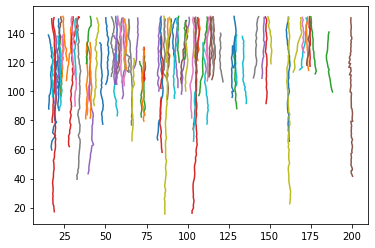

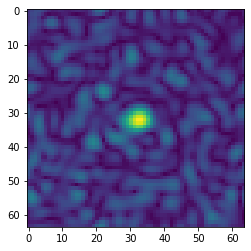

In [3]:
"""Saves images and positions for individual particles."""
particles_timeseries = []
particles_positions = []
num_particles = 100
IMAGE_SIZE = 64

for i in range(num_particles):
    frames = data[i]["Positions"][:,0].astype(int)
    positions = data[i]["Positions"][:,1:4]
    particles_positions.append(positions)

    roi_data = np.array(data[i]['ROI'][0])
    timeseries = []
    for j in range(roi_data.shape[0]):
        particleROI = np.fft.ifft2(exp_expand(roi_data[j,:], shape))
        particleROI = np.fft.fftshift(particleROI)
        particleROI = np.expand_dims(particleROI, axis = -1)
        timeseries.append(particleROI)
    particles_timeseries.append(np.array(timeseries))

for particle_id in range(num_particles):
    plt.plot(particles_positions[particle_id][:,0], particles_positions[particle_id][:,1])
plt.show()

for _ in range(1):
    plt.imshow(np.abs(particles_timeseries[0][_,:,:,0]))
    plt.show()

training images shape (13, 64, 64, 2)
validation images shape (64, 64, 64, 1)


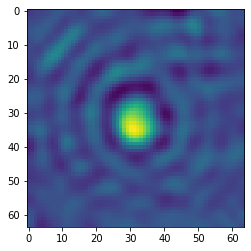

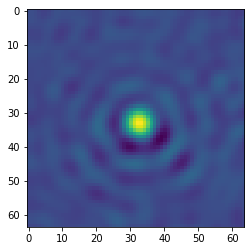

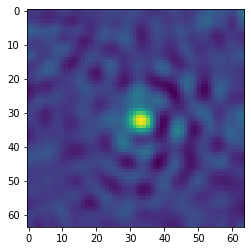

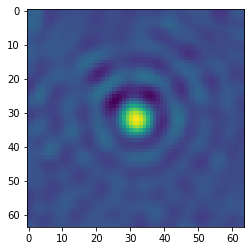

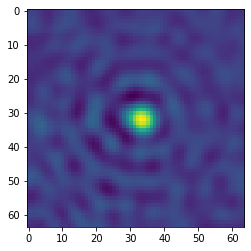

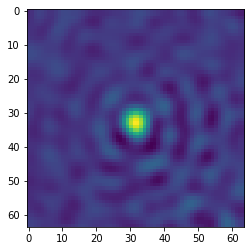

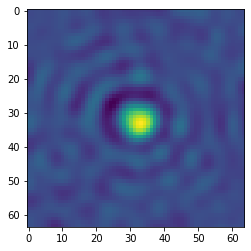

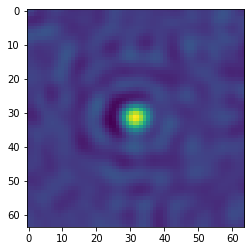

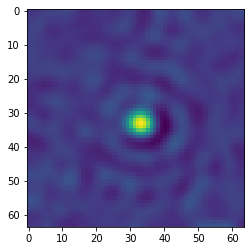

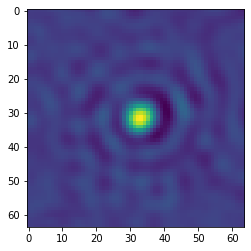

In [4]:
particle_id = 10
training_images = np.stack((np.real(particles_timeseries[particle_id])[::5,:,:,0], np.imag(particles_timeseries[particle_id][::5,:,:,0])), axis=-1)
print(f"training images shape {training_images.shape}")
validation_set = particles_timeseries[particle_id][:,:,:,:]
print(f"validation images shape {validation_set.shape}")

"""Create group/equivariance"""

crop_size = 64
padding = 32
wavelength = 525e-9
pixel_size = 114e-9 #??
crop_propagation_forward = dt.get_propagation_matrix((crop_size + 2 * padding, ) * 2, 1e-7, pixel_size * 2, wavelength)
crop_propagation_backward = dt.get_propagation_matrix((crop_size + 2 * padding, ) * 2, -1e-7, pixel_size * 2, wavelength)

args = dt.Arguments(
    translate=lambda: np.random.randn(2)*0.5,
    rotate=lambda: np.random.uniform(0, np.pi*2),
    z=lambda: np.random.randn(1)*20,
)

group = ( 
    dt.Affine(rotate=args.rotate) 
    >> dt.Affine(translate=args.translate) 
    >> dt.Gaussian(sigma=lambda: np.random.rand() * 0.00)
    >> dt.FourierTransform() 
    >> dt.FourierTransformTransformation(crop_propagation_forward, crop_propagation_backward, args.z) 
    >> dt.InverseFourierTransform() 
)

equivariance = (
    dt.models.lodestar.Rotational2DEquivariance(args.rotate)
    >> dt.models.lodestar.TranslationalEquivariance(args.translate)
    >> dt.models.lodestar.Equivariance(1, args.z/10, indexes=2)
)

import random
def create_training_set(training_images):
    return dt.Value(lambda: random.choice(training_images))

training_set = create_training_set(training_images)

for _ in range(10):
    x = (training_set>>group).update()()
    plt.imshow(x[..., 1])
    plt.show()


In [5]:
#@title
"""Create custom layers"""
from tensorflow.math import abs, angle, real, imag, subtract, multiply

class CustomLayerOne(keras.layers.Layer):
    "Dpes nothing"
    def __init__(self):
        super().__init__()

    def build( self, input_shape):
        super().build(input_shape)

    def call(self, image):
        image = tf.dtypes.complex(image[...,0], image[...,1])
        norm_image = subtract(image, 1)
        return tf.stack([real(norm_image), imag(norm_image), angle(image)], axis=-1)#tf.stack([abs(norm_image), angle(image), real(norm_image), imag(norm_image)], axis=-1)

class CustomLayerTwo(keras.layers.Layer):
    "Takes 2 layers as input and outputs 3 layers."
    def __init__(self):
        super().__init__()

    def build( self, input_shape):
        super().build(input_shape)

    def call(self, image):
        image = tf.dtypes.complex(image[...,0], image[...,1])
        norm_image = subtract(image, 1)
        return tf.stack([real(norm_image), imag(norm_image), abs(norm_image)], axis=-1)#tf.stack([abs(norm_image), angle(image), real(norm_image), imag(norm_image)], axis=-1)

class CustomLayerThree(keras.layers.Layer):
    "Takes 2 layers as input and outputs 4 layers."
    def __init__(self):
        super().__init__()

    def build( self, input_shape):
        super().build(input_shape)

    def call(self, image):
        image = tf.dtypes.complex(image[...,0], image[...,1])
        norm_image = subtract(image, 1)
        return tf.stack([abs(norm_image), angle(image), real(norm_image), imag(norm_image)], axis=-1)


In [6]:
#@title
"""Create models"""
num_outputs = 3

def create_model(custom_layer, nlayers):
    model = keras.models.Sequential()
    model.add(keras.Input(shape=(IMAGE_SIZE,IMAGE_SIZE,2)))
    model.add(custom_layer)
    model.add(keras.layers.Conv2D(32, 3, activation='relu', strides=(2,2)))
    for _ in range(nlayers):
        model.add(keras.layers.Conv2D(64, 3, activation='relu'))
    model.add(keras.layers.Conv2D(num_outputs+1,1))
    model = dt.models.LodeSTAR(model=model, input_shape=(None, None, 2), num_outputs=num_outputs)
    model.specs = {"Layers": nlayers}
    model.totalhistory = {"total_loss":[], "consistency_loss":[]}
    model.compile(loss=["mae", "mae", "mae"], optimizer=tf.keras.optimizers.Adam(), loss_weights=[1, 1, 1])
    return model

models = [create_model(CustomLayerThree(), 1)]


In [7]:
"""Create generator"""
generator = dt.models.lodestar.LodeSTARGenerator(
    training_set,
    num_outputs=num_outputs, 
    transformation_function=(group, equivariance), 
    batch_size=8, 
    min_data_size=100, 
    max_data_size=201,
)

Generating 103 / 100 samples before starting training


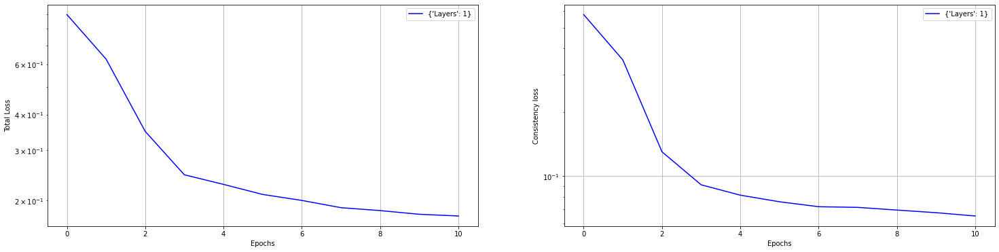

Generating 200 / 100 samples before starting training


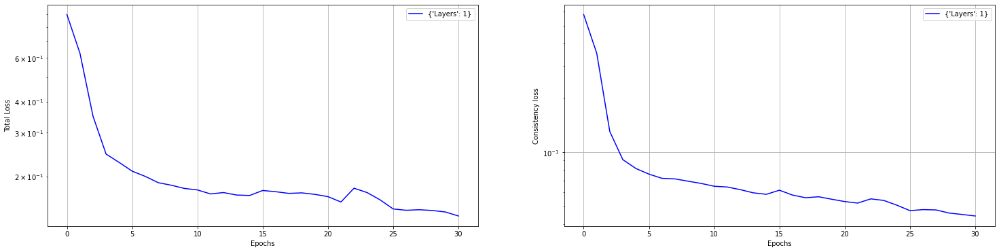

Generating 200 / 100 samples before starting training


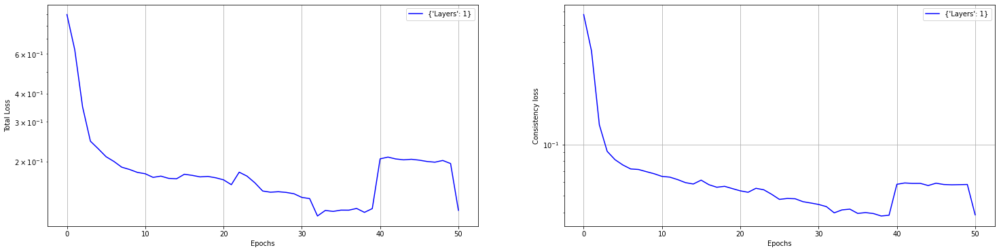

Generating 200 / 100 samples before starting training


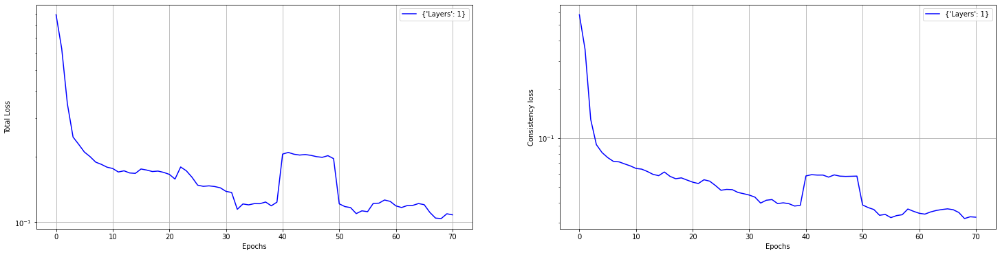

Generating 201 / 100 samples before starting training


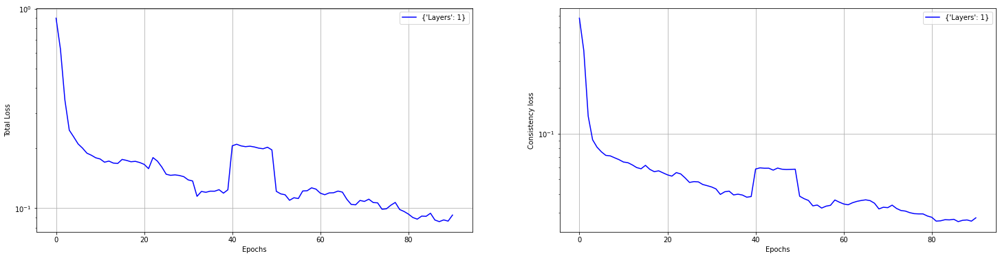

Generating 200 / 100 samples before starting training


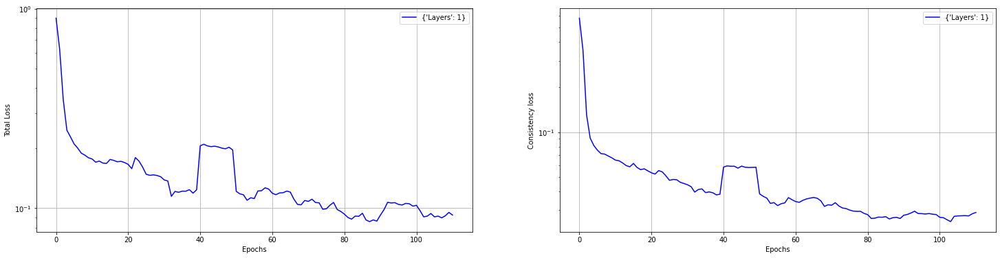

Generating 200 / 100 samples before starting training


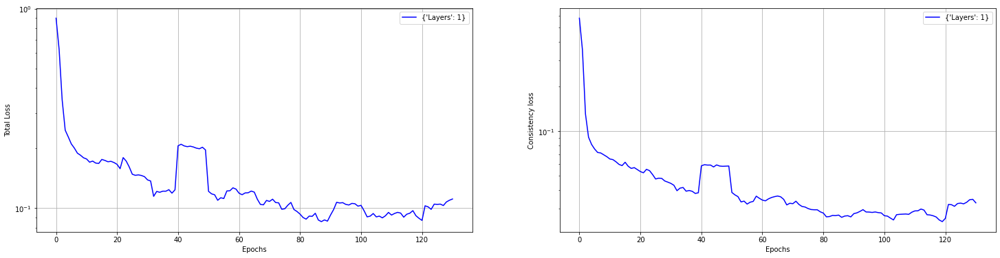

Generating 200 / 100 samples before starting training


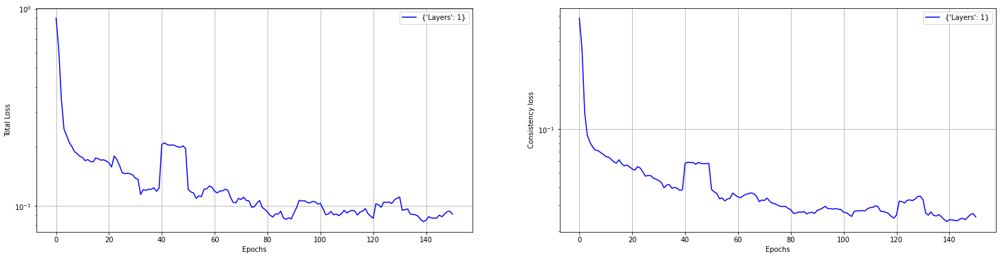

Generating 200 / 100 samples before starting training


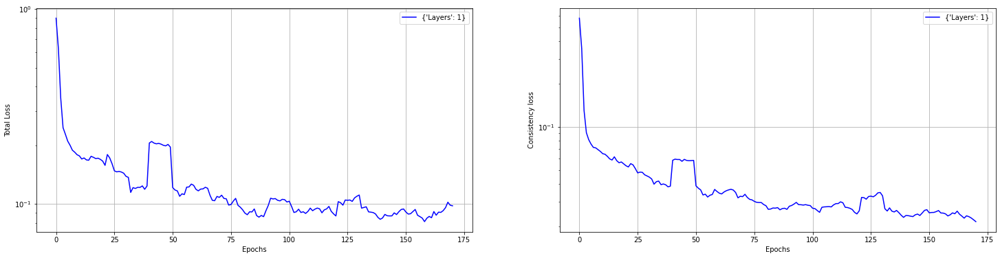

Generating 201 / 100 samples before starting training


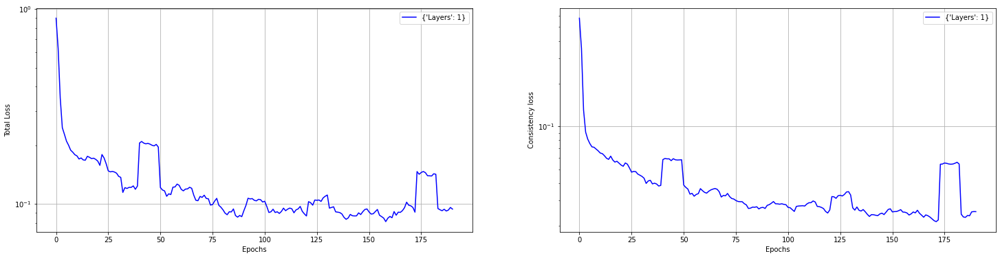

In [8]:
def save_progress(model, h):
    model.totalhistory["total_loss"].extend(h.history["total_loss"])
    model.totalhistory["consistency_loss"].extend(h.history["consistency_loss"])

def plot_progress(models):
    def moving_average(x, w):
        return np.convolve(x, np.ones(w), 'valid') / w

    cc = (cycler(color=list('bgrcmyk')))
    fig, (ax1, ax2) = plt.subplots(1,2,figsize=(25,6))
    ax1.set_prop_cycle(cc)
    ax2.set_prop_cycle(cc)

    for i, model in enumerate(models):
        ax1.plot(moving_average(model.totalhistory["total_loss"], 10), label=f"{model.specs}")
        ax1.set_xlabel("Epochs")
        ax1.set_ylabel("Total Loss")
        ax1.set_yscale("log")
        ax1.legend()

        ax2.plot(moving_average(model.totalhistory["consistency_loss"], 10), label=f"{model.specs}")
        ax2.set_xlabel("Epochs")
        ax2.set_ylabel("Consistency loss")
        ax2.set_yscale("log")
        ax2.legend()

    ax1.grid(True)
    ax2.grid(True)
    plt.show()

for _ in range(10):
    with generator:
        for model in models:
            h = model.fit(generator, epochs=20, steps_per_epoch=100, verbose=0)
            save_progress(model, h)
        plot_progress(models)
        



In [9]:
for model in models:
    print(model.specs)
    model.summary()


{'Layers': 1}
Model: "lode_star_base_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 29, 29, 4)         19940     
                                                                 
Total params: 19,940
Trainable params: 19,940
Non-trainable params: 0
_________________________________________________________________


In [10]:
def get_propagation_matrix(shape, to_z, pixel_size, wavelength):

    k = 2 * np.pi / wavelength
    yr, xr, *_ = shape

    x = 2 * np.pi / pixel_size * np.arange(-(xr / 2 - 1 / 2), (xr / 2 + 1 / 2), 1) / xr
    y = 2 * np.pi / pixel_size * np.arange(-(yr / 2 - 1 / 2), (yr / 2 + 1 / 2), 1) / yr
    KXk, KYk = np.meshgrid(x, y)

    K = np.real(
        np.sqrt(np.array(1 - (KXk / k) ** 2 - (KYk / k) ** 2, dtype=np.complex64))
    )
    C = np.fft.fftshift(((KXk / k) ** 2 + (KYk / k) ** 2 < 1) * 1.0)

    return C * np.fft.fftshift(np.exp(k * 1j * to_z * (K - 1)))

def fourier_transform(image, padding=32):
    im = np.pad(image, ((padding, padding), (padding, padding)), mode="symmetric")
    return np.fft.fft2(im)

def inverse_fourier_transform(image, padding=32):
    im = np.fft.ifft2(image)
    return im[padding:-padding, padding:-padding]

def fourier_transform_transformation(image, Tz, Tzinv, i):
    if i < 0:
        image *= Tzinv ** np.abs(i)
    else:
        image *= Tz ** i
    return image

def propagate(image, z):
    """Re-propagate the images using PAS"""
    ft_image = fourier_transform(image[:,:,0])
    prop_ft_image = fourier_transform_transformation(ft_image, crop_propagation_backward, crop_propagation_forward, z)
    return np.expand_dims(inverse_fourier_transform(prop_ft_image),axis=-1)

{'Layers': 1}
PROPAGERADE BILDER


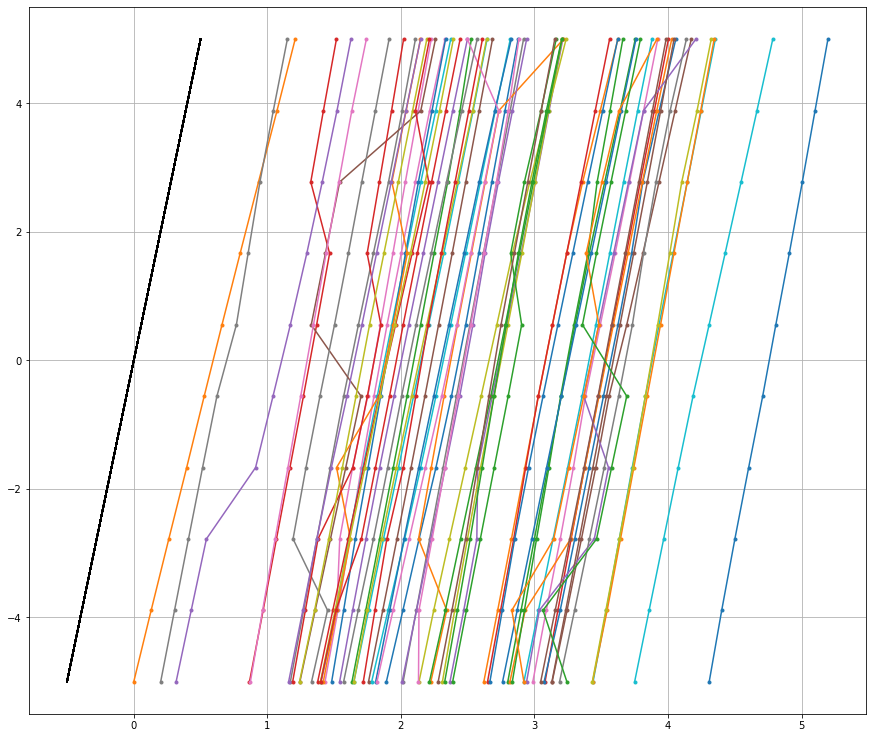

STD: 3.030


In [11]:
cc = (cycler(color=list('bgrcmyk')))

def predict_on_stack(model, val_stack):
    """returns a numpy tensor containing propagated distance as well as the prediction, for ever propagation distance and every image images"""
    try:
        dets = np.array(model.predict_and_detect(val_stack, mode="ratio"))
    except ValueError as E:
        dets = np.expand_dims(np.zeros((val_stack.shape[0],3)), axis=0)
        print(E)
    dets = reshape_dets(dets)
    dets *= multfact
    #dets[:,2] = dets[:,2] - np.mean(dets[:,2])
    return dets

def reshape_dets(dets):
    """Removes all particles but the one closest to the center. If no particles are detected, sets the value to 0."""
    out = []
    for coords in dets:
        if coords.shape != (0, 3):
            x, y = IMAGE_SIZE//2, IMAGE_SIZE//2
            idx = np.argmin(np.array(coords[:,:2]- np.array((x, y))), axis=0)[0]
            out.append(coords[idx,:])
        else:
            out.append([0,0,0])
    return np.array(out)

def create_validation_stack(images, z_list):
    """"""
    output = []
    for i in range(images.shape[0]):
        image = images[i,:,:,:]
        stack = []
        for z in z_list:
            stack.append(propagate(image, z))
        output.append(stack)
    return np.stack((np.real(output), np.imag(output)), axis=-1)[:,:,:,:,0,:]

def plot_preds(val_stack):
    for particle_id in range(from_id, from_id+num_samples):
        dets = model.predict_and_detect(val_stack[:,:,:,:], mode="ratio"), 
        plt.figure(figsize=(10, 10))
        plt.imshow(np.abs(val_stack[stack_id,:,:,0]+1j*val_stack[stack_id,:,:,1]), cmap="bone")
        dets = np.squeeze(np.array(dets))
        print(dets)
        plt.scatter(dets[stack_id,1], dets[stack_id,0], s=200, facecolor="none", linewidths=3, edgecolors="g")
        plt.show()
        
        dets[:,2] *= multfact
        #dets[:,2] -= np.mean(dets[:,2])
        #[print(d) for d in dets]

def evaluate_model(model, val_stack, prop_range):
    accs = []
    for i in range(num_samples):
        accs.append(predict_on_stack(model, val_stack[from_id+i])[:,2])
    accs = np.array(accs)
    accs = accs - np.min(accs)

    stds = []
    fig, ax = plt.subplots(1,1, figsize=(15,13))
    for i in range(accs.shape[0]):
        ax.plot(prop_range/10, prop_range, 'k')
        ax.plot(accs[i,:].flatten(), prop_range, '.-')
        ax.grid(True)
        stds.append(np.std(accs[i,:].flatten() - prop_range))
    plt.show()
    print(f"STD: {np.std((accs-prop_range).flatten()):.3f}", )

model = models[-1]
#for model in models:
prop_range = np.linspace(-5, 5, 10) #np.random.randn(70)
from_id = 0
num_samples = len(particles_positions[particle_id][:,0])
stack_id = len(prop_range)//2
multfact = -1
print(model.specs)
print("PROPAGERADE BILDER")
val_stack = create_validation_stack(validation_set, prop_range)
evaluate_model(model, val_stack, prop_range)

val_stack = np.stack( (np.real(validation_set[:,:,:,0]), np.imag(validation_set[:,:,:,0])), axis=-1)
corrections = predict_on_stack(model, val_stack)
x_lode, y_lode, z_lode = corrections[:,0], corrections[:,1], corrections[:,2]
x_matlab, y_matlab, z_matlab = particles_positions[particle_id][:,0], particles_positions[particle_id][:,1], particles_positions[particle_id][:,2]
z_lode = z_lode/-10
z_lode = z_lode - np.mean(z_lode)
x_new, y_new, z_new = x_matlab+(32+x_lode)*0.114, y_matlab+(32+y_lode)*0.114, z_lode+z_matlab


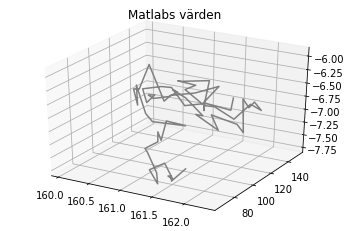

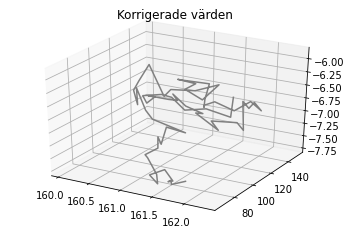

Matlab!


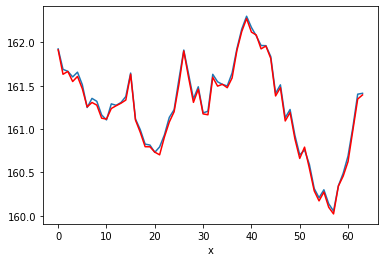

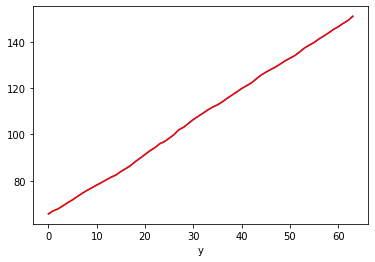

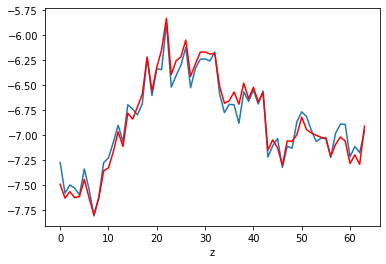

In [12]:
from mpl_toolkits import mplot3d

ax = plt.axes(projection='3d')
ax.plot3D(x_matlab, y_matlab, z_matlab, 'gray')
ax.set_title("Matlabs värden")
plt.show()

ax = plt.axes(projection='3d')
ax.plot3D(x_matlab, y_matlab, z_matlab+z_lode, 'gray')
ax.set_title("Korrigerade värden")
plt.show()

print("Matlab!")
plt.plot(list(range(len(x_matlab))), x_matlab)
plt.xlabel("x")
plt.plot(list(range(len(x_lode))), x_new, 'r')
plt.show()

plt.plot(list(range(len(y_matlab))), y_matlab)
plt.plot(list(range(len(y_lode))), y_new, 'r')
plt.xlabel("y")
plt.show()

plt.plot(list(range(len(z_matlab))), z_matlab)
plt.plot(list(range(len(z_lode))), z_new, 'r')
plt.xlabel("z")
plt.show()

#https://journals.aps.org/pre/pdf/10.1103/PhysRevE.89.022726

In [13]:
def calc_sigma(arr):
    sigma2 = np.abs(np.mean(
        np.multiply(
            np.diff(arr[:-1]), 
            np.diff(arr[1:])
            )
    ))
    return np.sqrt(sigma2)

print(f"sigma_x_new: {calc_sigma(x_new):.3f}")
print(f"sigma_x_matlab: {calc_sigma(x_matlab):.3f}")
print(f"sigma_z_new: {calc_sigma(z_new):.3f}")
print(f"sigma_z_matlab: {calc_sigma(z_matlab):.3f}")


sigma_x_new: 0.075
sigma_x_matlab: 0.085
sigma_z_new: 0.108
sigma_z_matlab: 0.138


PARTICLE ID:  0
training images shape (16, 64, 64, 2)
validation images shape (16, 64, 64, 1)


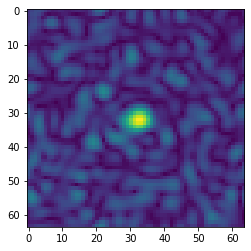

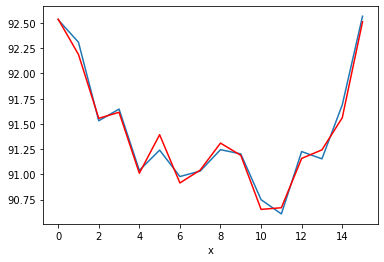

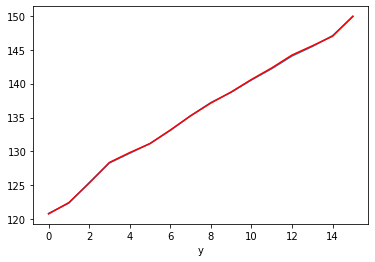

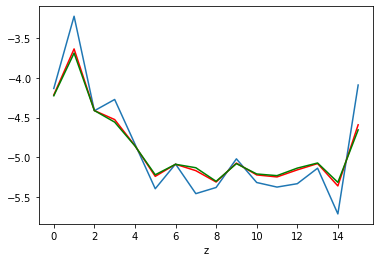

sigma_x_matlab: 0.122
sigma_x_new: 0.088

sigma_y_matlab: 1.927
sigma_y_new: 1.924

sigma_z_matlab: 0.417
sigma_z_new: 0.199
sigma_z_oil: 0.172
sigma_z_multfact: 0.074
z_mult: 1.894161937950381

PARTICLE ID:  1
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


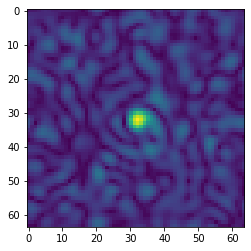

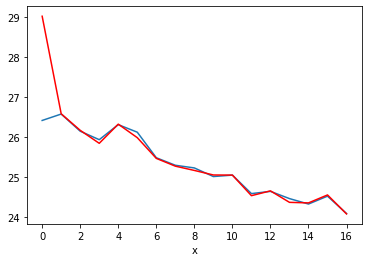

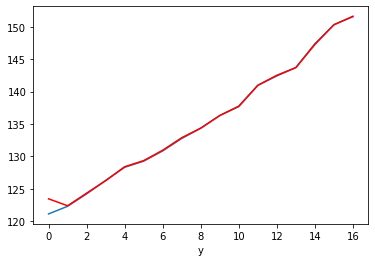

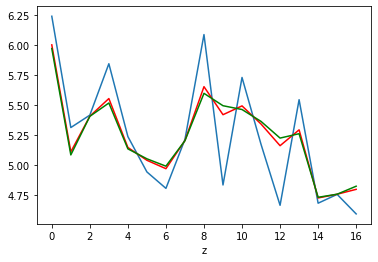

sigma_x_matlab: 0.025
sigma_x_new: 0.251

sigma_y_matlab: 1.931
sigma_y_new: 1.850

sigma_z_matlab: 0.483
sigma_z_new: 0.155
sigma_z_oil: 0.127
sigma_z_multfact: 0.152
z_mult: 1.3062039487206687

PARTICLE ID:  2
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


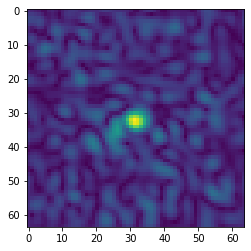

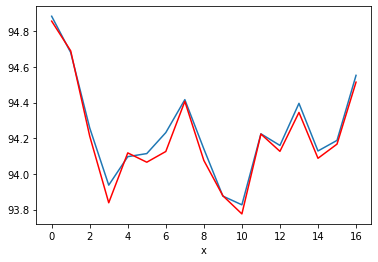

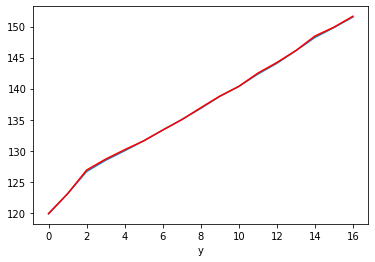

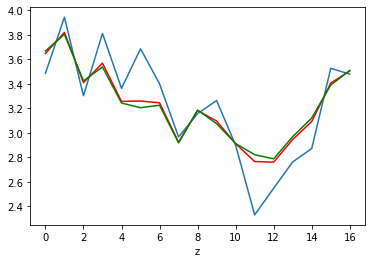

sigma_x_matlab: 0.087
sigma_x_new: 0.030

sigma_y_matlab: 1.986
sigma_y_new: 1.990

sigma_z_matlab: 0.241
sigma_z_new: 0.097
sigma_z_oil: 0.084
sigma_z_multfact: 0.081
z_mult: 1.3850657374645046

PARTICLE ID:  3
training images shape (33, 64, 64, 2)
validation images shape (33, 64, 64, 1)


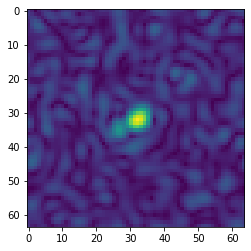

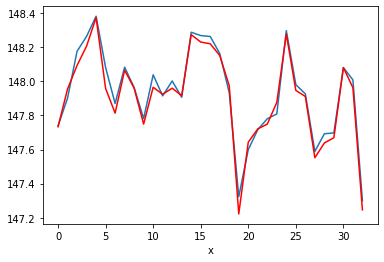

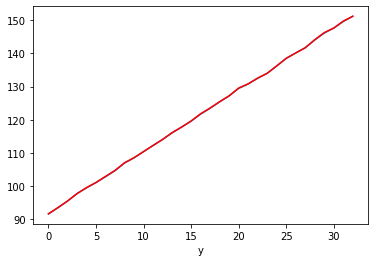

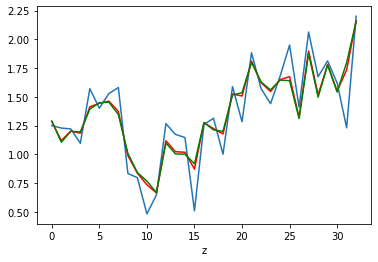

sigma_x_matlab: 0.072
sigma_x_new: 0.088

sigma_y_matlab: 1.861
sigma_y_new: 1.859

sigma_z_matlab: 0.278
sigma_z_new: 0.148
sigma_z_oil: 0.140
sigma_z_multfact: 0.139
z_mult: 1.3673030547391356

PARTICLE ID:  4
training images shape (23, 64, 64, 2)
validation images shape (23, 64, 64, 1)


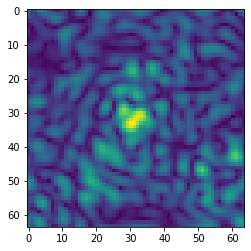

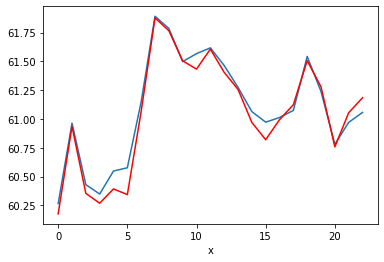

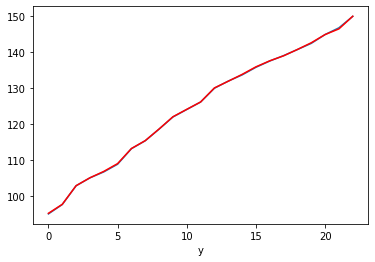

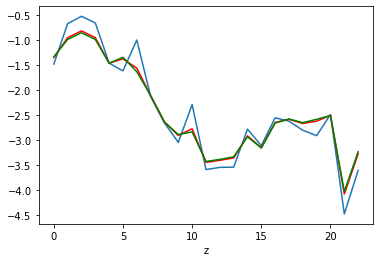

sigma_x_matlab: 0.059
sigma_x_new: 0.078

sigma_y_matlab: 2.480
sigma_y_new: 2.461

sigma_z_matlab: 0.440
sigma_z_new: 0.239
sigma_z_oil: 0.221
sigma_z_multfact: 0.185
z_mult: 1.6133039069110835

PARTICLE ID:  5
training images shape (29, 64, 64, 2)
validation images shape (29, 64, 64, 1)


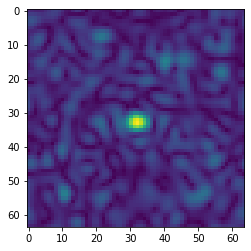

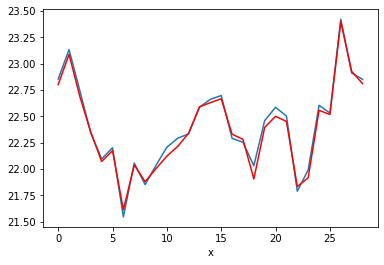

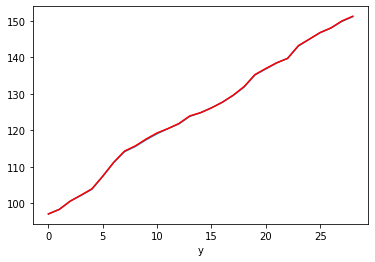

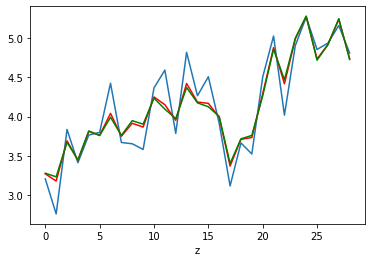

sigma_x_matlab: 0.181
sigma_x_new: 0.164

sigma_y_matlab: 1.999
sigma_y_new: 2.002

sigma_z_matlab: 0.395
sigma_z_new: 0.205
sigma_z_oil: 0.186
sigma_z_multfact: 0.145
z_mult: 1.6577097560783793

PARTICLE ID:  6
training images shape (23, 64, 64, 2)
validation images shape (23, 64, 64, 1)


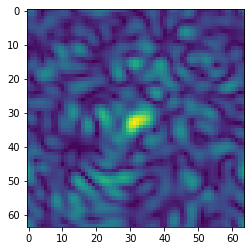

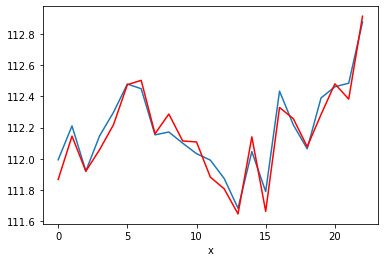

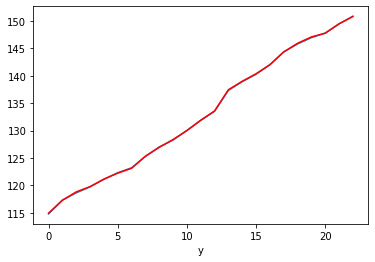

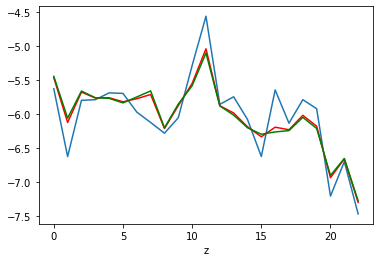

sigma_x_matlab: 0.152
sigma_x_new: 0.195

sigma_y_matlab: 1.631
sigma_y_new: 1.628

sigma_z_matlab: 0.384
sigma_z_new: 0.204
sigma_z_oil: 0.191
sigma_z_multfact: 0.183
z_mult: 1.4229154647491646

PARTICLE ID:  7
training images shape (18, 64, 64, 2)
validation images shape (18, 64, 64, 1)


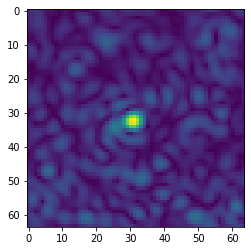

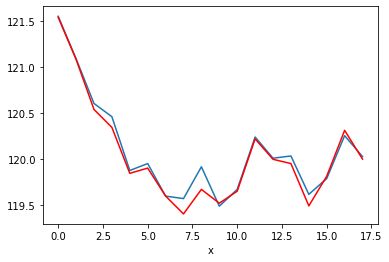

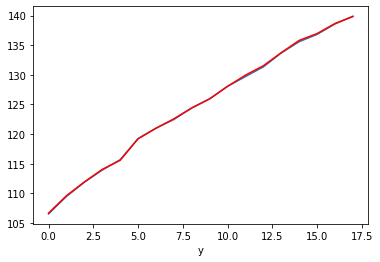

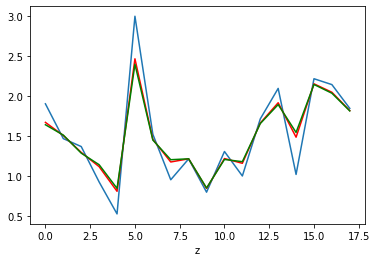

sigma_x_matlab: 0.060
sigma_x_new: 0.109

sigma_y_matlab: 1.954
sigma_y_new: 1.940

sigma_z_matlab: 0.605
sigma_z_new: 0.379
sigma_z_oil: 0.351
sigma_z_multfact: 0.253
z_mult: 2.4709228468853004

PARTICLE ID:  8
training images shape (19, 64, 64, 2)
validation images shape (19, 64, 64, 1)


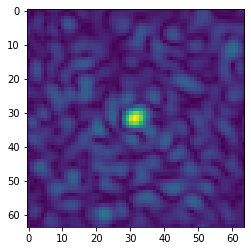

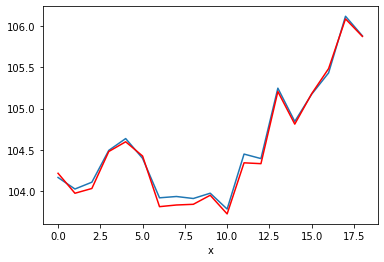

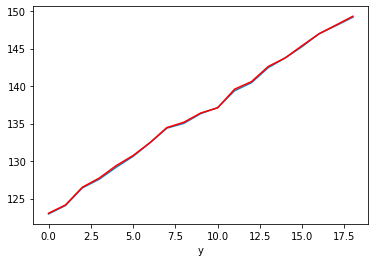

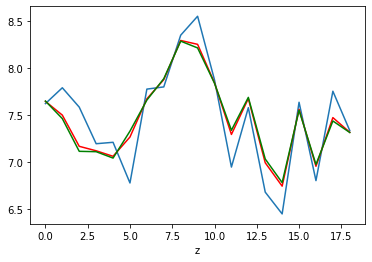

sigma_x_matlab: 0.163
sigma_x_new: 0.146

sigma_y_matlab: 1.442
sigma_y_new: 1.433

sigma_z_matlab: 0.431
sigma_z_new: 0.225
sigma_z_oil: 0.204
sigma_z_multfact: 0.154
z_mult: 1.699527831709509

PARTICLE ID:  9
training images shape (32, 64, 64, 2)
validation images shape (32, 64, 64, 1)


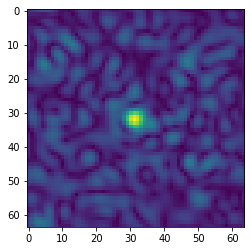

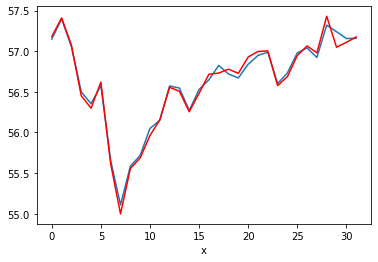

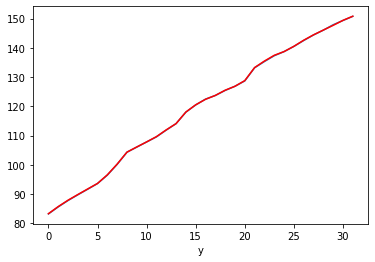

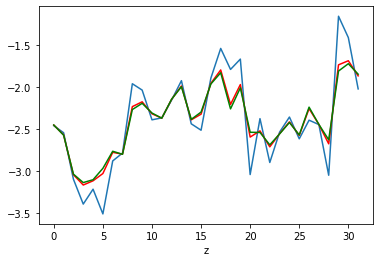

sigma_x_matlab: 0.092
sigma_x_new: 0.067

sigma_y_matlab: 2.232
sigma_y_new: 2.233

sigma_z_matlab: 0.321
sigma_z_new: 0.127
sigma_z_oil: 0.107
sigma_z_multfact: 0.080
z_mult: 1.4883915795041278

PARTICLE ID:  10
training images shape (64, 64, 64, 2)
validation images shape (64, 64, 64, 1)


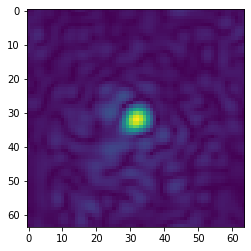

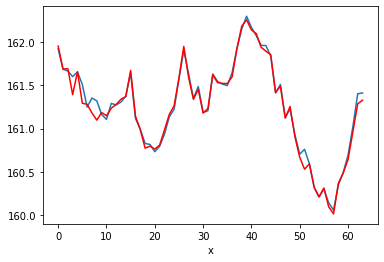

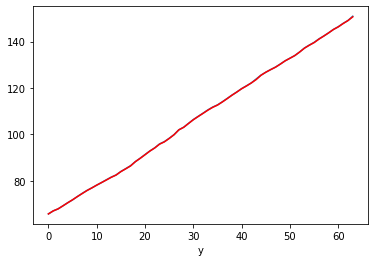

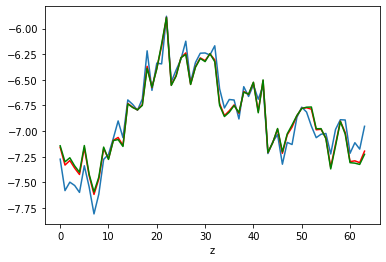

sigma_x_matlab: 0.085
sigma_x_new: 0.053

sigma_y_matlab: 1.351
sigma_y_new: 1.349

sigma_z_matlab: 0.138
sigma_z_new: 0.111
sigma_z_oil: 0.110
sigma_z_multfact: 0.109
z_mult: 1.4395622859425772

PARTICLE ID:  11
training images shape (16, 64, 64, 2)
validation images shape (16, 64, 64, 1)


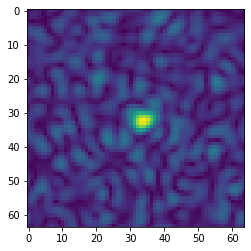

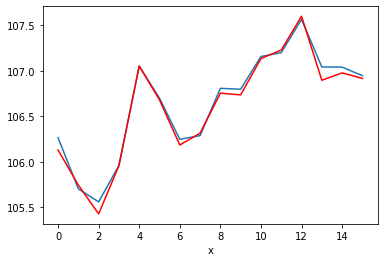

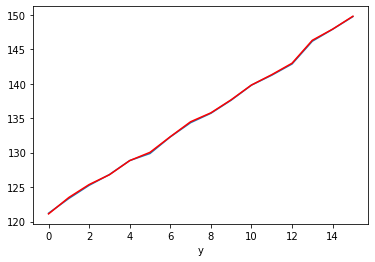

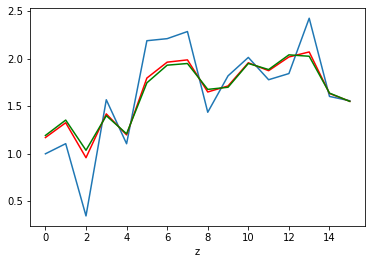

sigma_x_matlab: 0.070
sigma_x_new: 0.052

sigma_y_matlab: 1.872
sigma_y_new: 1.872

sigma_z_matlab: 0.450
sigma_z_new: 0.166
sigma_z_oil: 0.128
sigma_z_multfact: 0.042
z_mult: 1.7585002124961793

PARTICLE ID:  12
training images shape (19, 64, 64, 2)
validation images shape (19, 64, 64, 1)


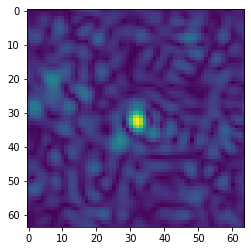

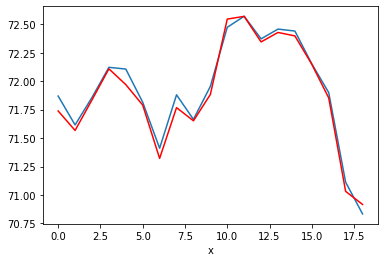

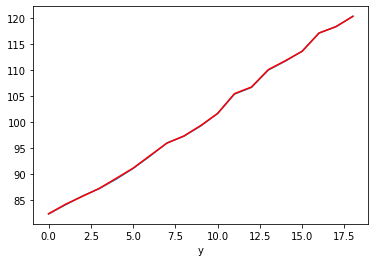

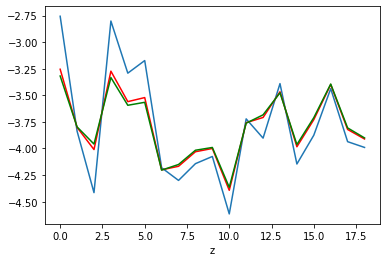

sigma_x_matlab: 0.159
sigma_x_new: 0.148

sigma_y_matlab: 2.081
sigma_y_new: 2.074

sigma_z_matlab: 0.391
sigma_z_new: 0.216
sigma_z_oil: 0.194
sigma_z_multfact: 0.117
z_mult: 2.165453305300146

PARTICLE ID:  13
training images shape (18, 64, 64, 2)
validation images shape (18, 64, 64, 1)


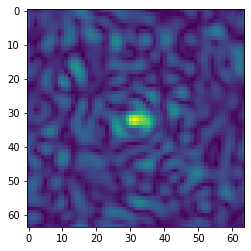

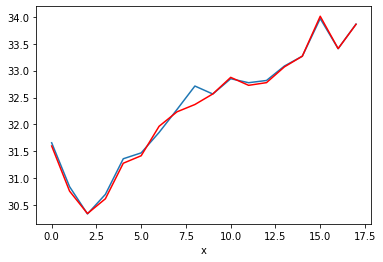

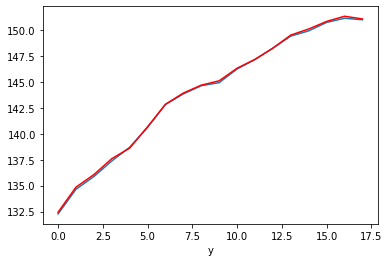

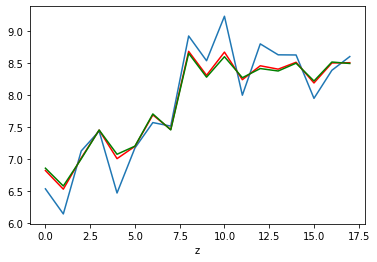

sigma_x_matlab: 0.146
sigma_x_new: 0.138

sigma_y_matlab: 1.172
sigma_y_new: 1.164

sigma_z_matlab: 0.492
sigma_z_new: 0.306
sigma_z_oil: 0.291
sigma_z_multfact: 0.268
z_mult: 1.5594878085573223

PARTICLE ID:  14
training images shape (21, 64, 64, 2)
validation images shape (21, 64, 64, 1)


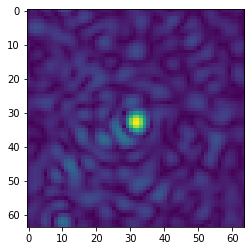

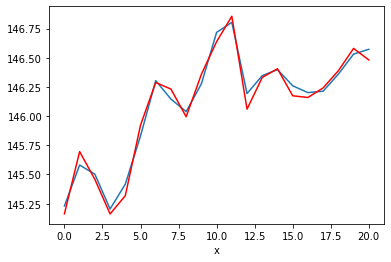

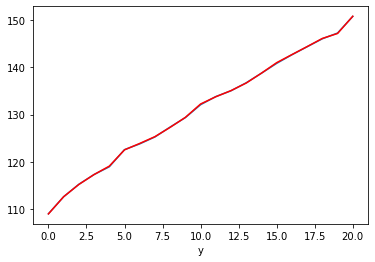

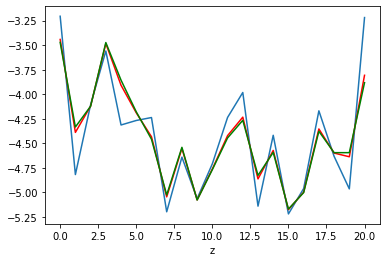

sigma_x_matlab: 0.095
sigma_x_new: 0.065

sigma_y_matlab: 1.997
sigma_y_new: 2.000

sigma_z_matlab: 0.479
sigma_z_new: 0.253
sigma_z_oil: 0.225
sigma_z_multfact: 0.125
z_mult: 2.063578568389123

PARTICLE ID:  15
training images shape (81, 64, 64, 2)
validation images shape (81, 64, 64, 1)


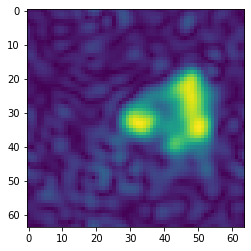

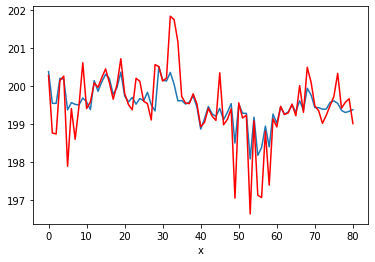

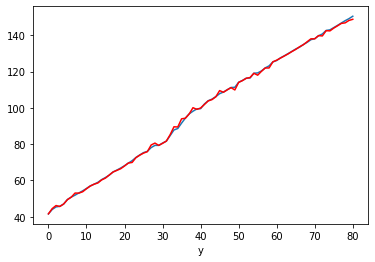

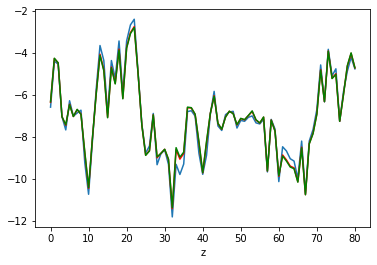

sigma_x_matlab: 0.297
sigma_x_new: 0.666

sigma_y_matlab: 1.338
sigma_y_new: 1.132

sigma_z_matlab: 0.698
sigma_z_new: 0.657
sigma_z_oil: 0.654
sigma_z_multfact: 0.646
z_mult: 1.937747521448459

PARTICLE ID:  16
training images shape (16, 64, 64, 2)
validation images shape (16, 64, 64, 1)


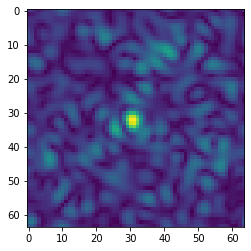

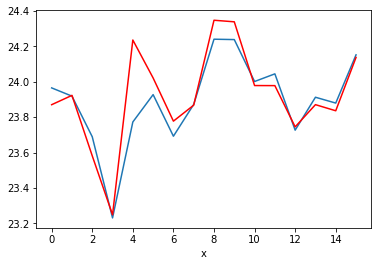

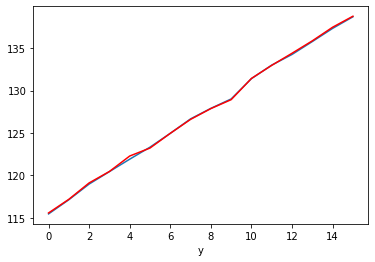

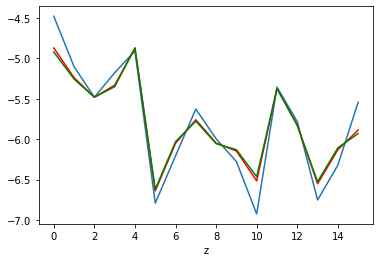

sigma_x_matlab: 0.107
sigma_x_new: 0.172

sigma_y_matlab: 1.547
sigma_y_new: 1.536

sigma_z_matlab: 0.410
sigma_z_new: 0.413
sigma_z_oil: 0.414
sigma_z_multfact: 0.420
z_mult: 0.17255753937096344

PARTICLE ID:  17
training images shape (90, 64, 64, 2)
validation images shape (90, 64, 64, 1)


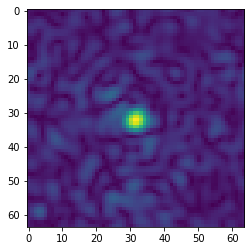

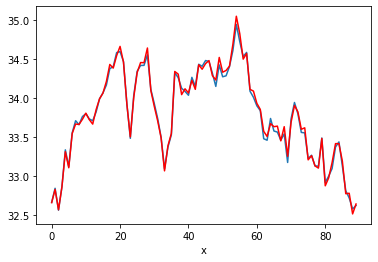

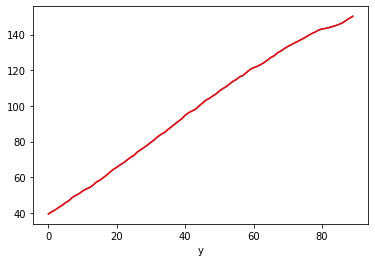

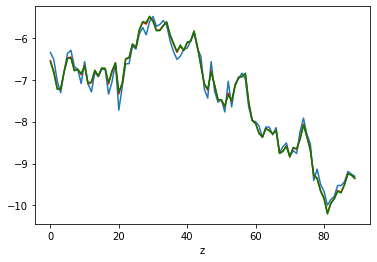

sigma_x_matlab: 0.036
sigma_x_new: 0.011

sigma_y_matlab: 1.262
sigma_y_new: 1.260

sigma_z_matlab: 0.154
sigma_z_new: 0.080
sigma_z_oil: 0.092
sigma_z_multfact: 0.109
z_mult: 0.6939529206866504

PARTICLE ID:  18
training images shape (16, 64, 64, 2)
validation images shape (16, 64, 64, 1)


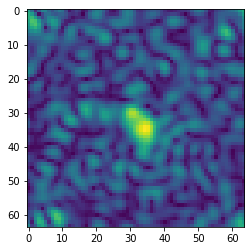

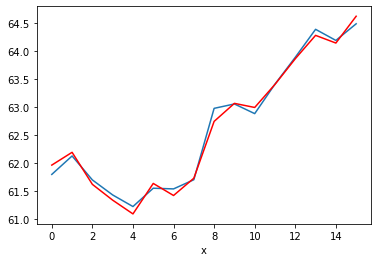

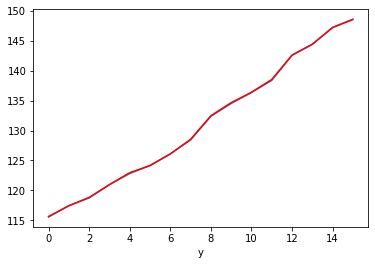

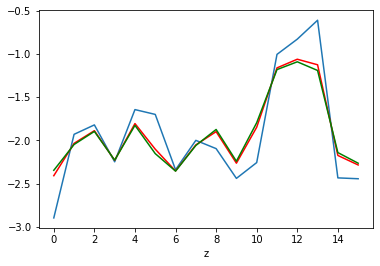

sigma_x_matlab: 0.187
sigma_x_new: 0.211

sigma_y_matlab: 2.226
sigma_y_new: 2.231

sigma_z_matlab: 0.163
sigma_z_new: 0.085
sigma_z_oil: 0.081
sigma_z_multfact: 0.076
z_mult: 0.5301890789316549

PARTICLE ID:  19
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


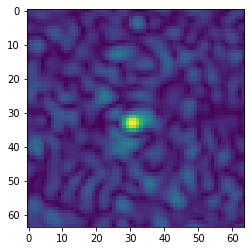

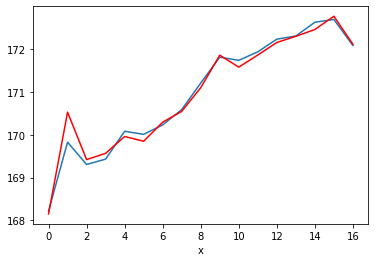

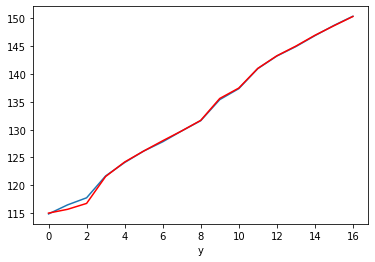

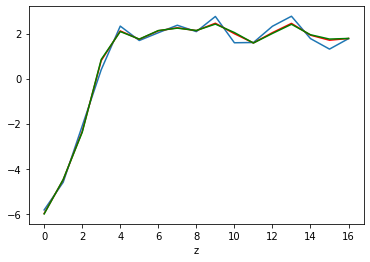

sigma_x_matlab: 0.110
sigma_x_new: 0.404

sigma_y_matlab: 2.241
sigma_y_new: 2.263

sigma_z_matlab: 0.890
sigma_z_new: 0.945
sigma_z_oil: 0.945
sigma_z_multfact: 0.930
z_mult: 4.143032457527833

PARTICLE ID:  20
training images shape (26, 64, 64, 2)
validation images shape (26, 64, 64, 1)


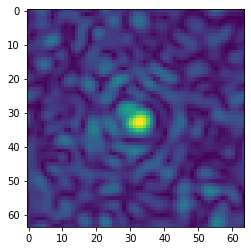

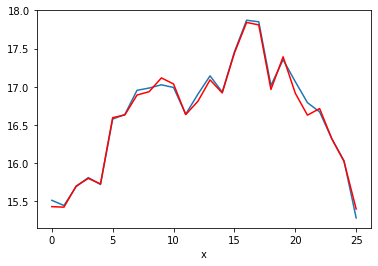

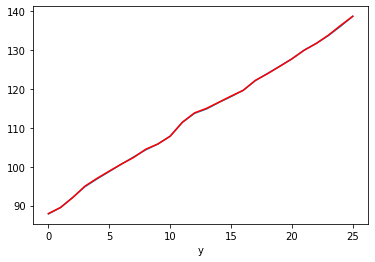

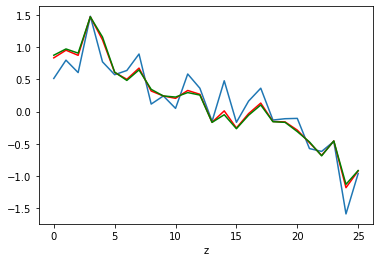

sigma_x_matlab: 0.077
sigma_x_new: 0.060

sigma_y_matlab: 2.043
sigma_y_new: 2.045

sigma_z_matlab: 0.352
sigma_z_new: 0.157
sigma_z_oil: 0.132
sigma_z_multfact: 0.042
z_mult: 1.7985451717539702

PARTICLE ID:  21
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


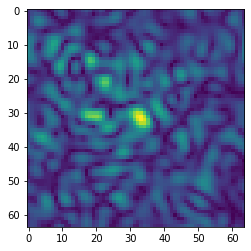

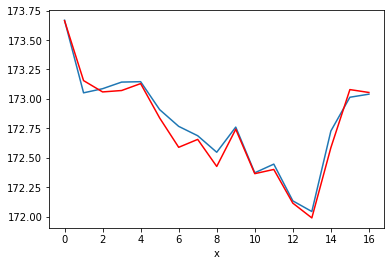

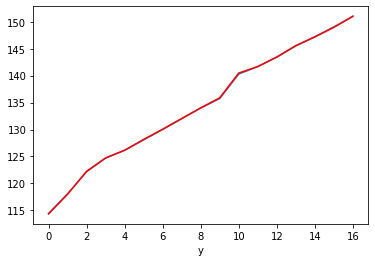

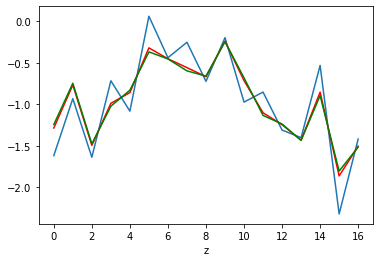

sigma_x_matlab: 0.053
sigma_x_new: 0.082

sigma_y_matlab: 2.272
sigma_y_new: 2.275

sigma_z_matlab: 0.666
sigma_z_new: 0.336
sigma_z_oil: 0.299
sigma_z_multfact: 0.199
z_mult: 1.7661037654424996

PARTICLE ID:  22
training images shape (24, 64, 64, 2)
validation images shape (24, 64, 64, 1)


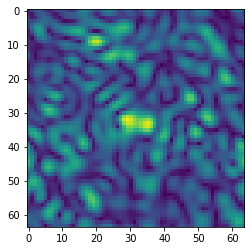

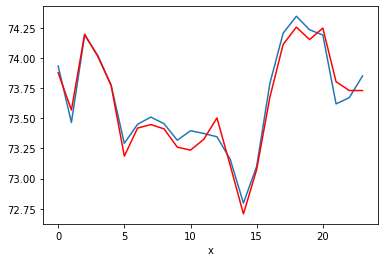

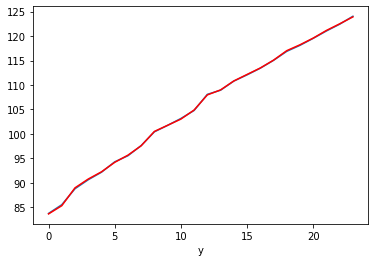

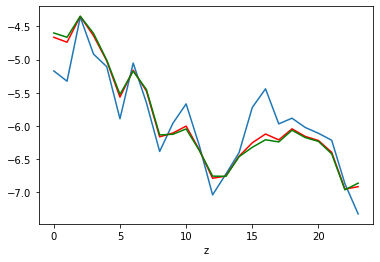

sigma_x_matlab: 0.078
sigma_x_new: 0.099

sigma_y_matlab: 1.737
sigma_y_new: 1.750

sigma_z_matlab: 0.164
sigma_z_new: 0.109
sigma_z_oil: 0.119
sigma_z_multfact: 0.132
z_mult: 0.5792565528622337

PARTICLE ID:  23
training images shape (79, 64, 64, 2)
validation images shape (79, 64, 64, 1)


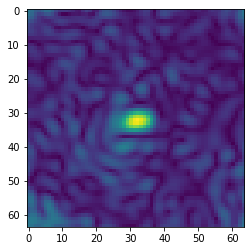

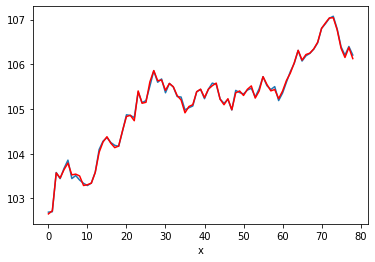

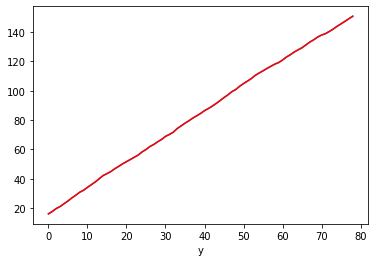

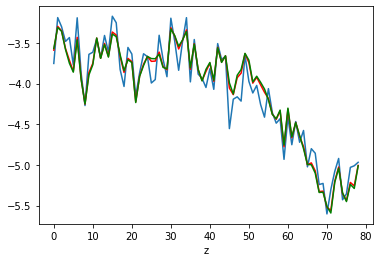

sigma_x_matlab: 0.009
sigma_x_new: 0.049

sigma_y_matlab: 1.725
sigma_y_new: 1.724

sigma_z_matlab: 0.229
sigma_z_new: 0.133
sigma_z_oil: 0.124
sigma_z_multfact: 0.102
z_mult: 1.7324016813676468

PARTICLE ID:  24
training images shape (29, 64, 64, 2)
validation images shape (29, 64, 64, 1)


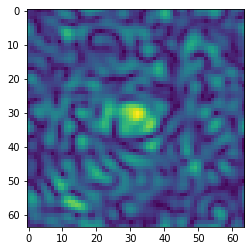

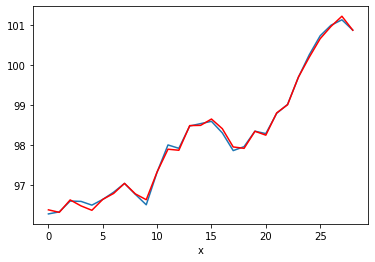

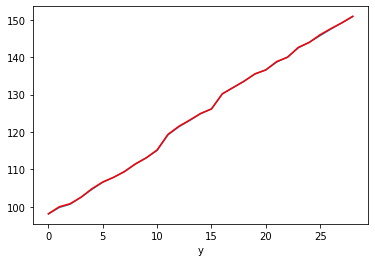

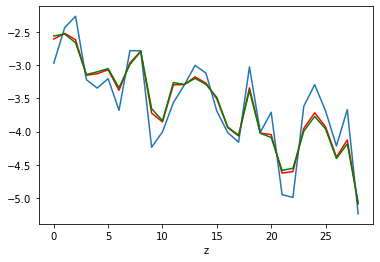

sigma_x_matlab: 0.231
sigma_x_new: 0.209

sigma_y_matlab: 1.879
sigma_y_new: 1.869

sigma_z_matlab: 0.323
sigma_z_new: 0.162
sigma_z_oil: 0.144
sigma_z_multfact: 0.100
z_mult: 1.7206551863154236

PARTICLE ID:  25
training images shape (16, 64, 64, 2)
validation images shape (16, 64, 64, 1)


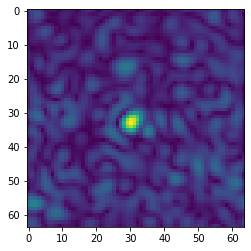

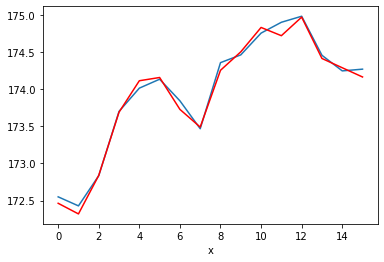

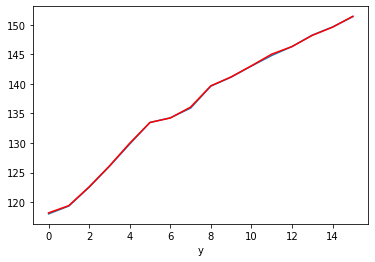

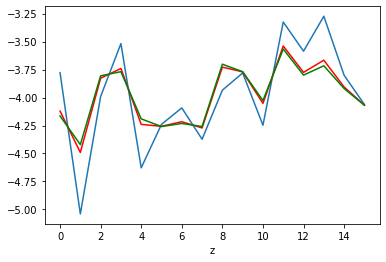

sigma_x_matlab: 0.206
sigma_x_new: 0.240

sigma_y_matlab: 2.322
sigma_y_new: 2.315

sigma_z_matlab: 0.437
sigma_z_new: 0.197
sigma_z_oil: 0.167
sigma_z_multfact: 0.059
z_mult: 1.8081322674248033

PARTICLE ID:  26
training images shape (23, 64, 64, 2)
validation images shape (23, 64, 64, 1)


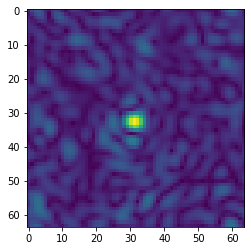

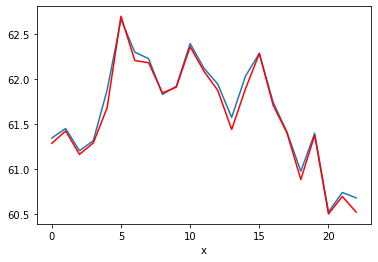

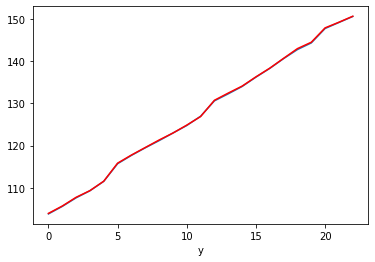

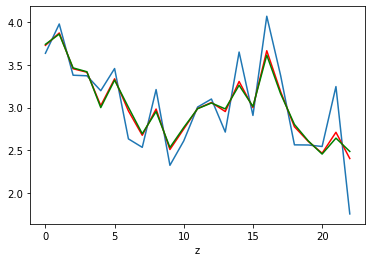

sigma_x_matlab: 0.139
sigma_x_new: 0.202

sigma_y_matlab: 2.135
sigma_y_new: 2.127

sigma_z_matlab: 0.459
sigma_z_new: 0.210
sigma_z_oil: 0.180
sigma_z_multfact: 0.092
z_mult: 1.746570656109256

PARTICLE ID:  27
training images shape (21, 64, 64, 2)
validation images shape (21, 64, 64, 1)


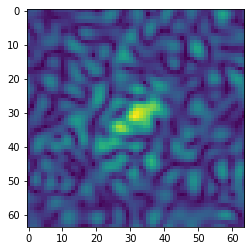

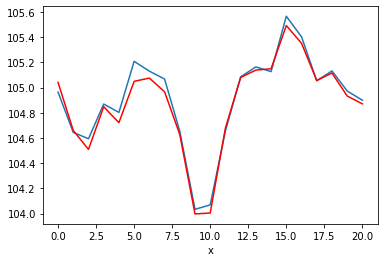

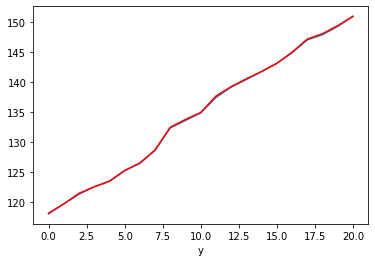

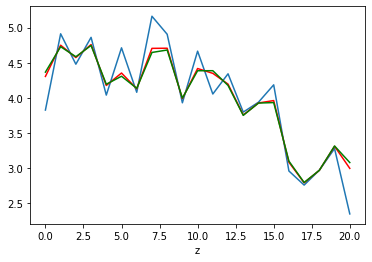

sigma_x_matlab: 0.151
sigma_x_new: 0.155

sigma_y_matlab: 1.647
sigma_y_new: 1.646

sigma_z_matlab: 0.487
sigma_z_new: 0.191
sigma_z_oil: 0.148
sigma_z_multfact: 0.098
z_mult: 2.195222749120574

PARTICLE ID:  28
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


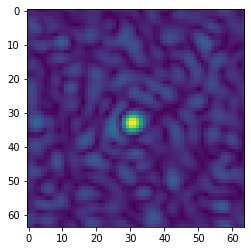

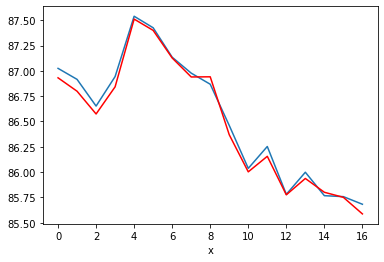

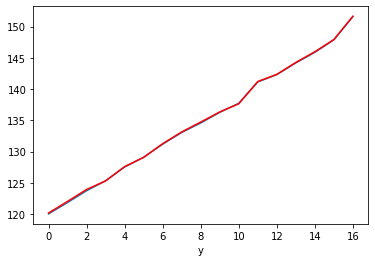

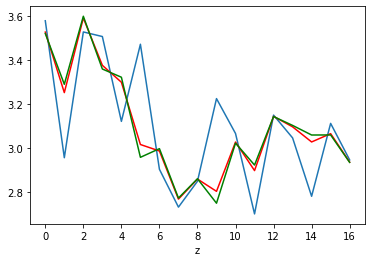

sigma_x_matlab: 0.042
sigma_x_new: 0.110

sigma_y_matlab: 1.889
sigma_y_new: 1.870

sigma_z_matlab: 0.245
sigma_z_new: 0.123
sigma_z_oil: 0.132
sigma_z_multfact: 0.204
z_mult: 0.902054526093522

PARTICLE ID:  29
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


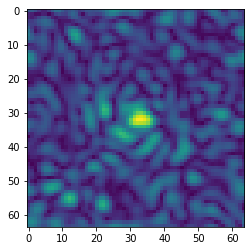

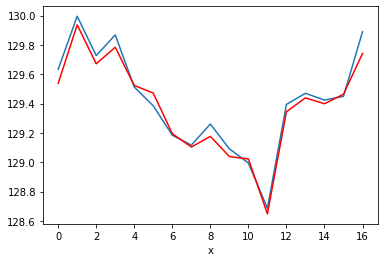

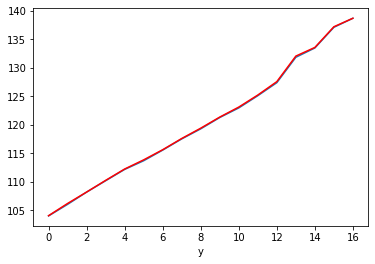

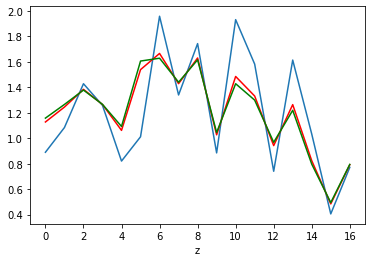

sigma_x_matlab: 0.128
sigma_x_new: 0.142

sigma_y_matlab: 2.160
sigma_y_new: 2.151

sigma_z_matlab: 0.453
sigma_z_new: 0.219
sigma_z_oil: 0.196
sigma_z_multfact: 0.149
z_mult: 1.6007924388420132

PARTICLE ID:  30
training images shape (26, 64, 64, 2)
validation images shape (26, 64, 64, 1)


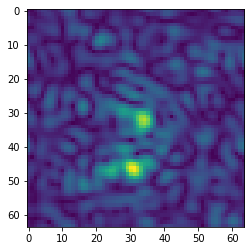

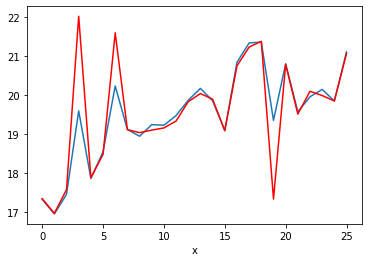

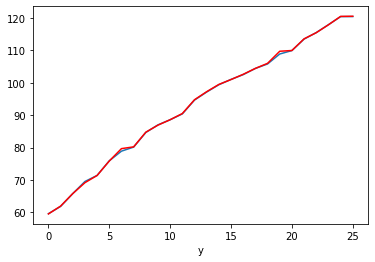

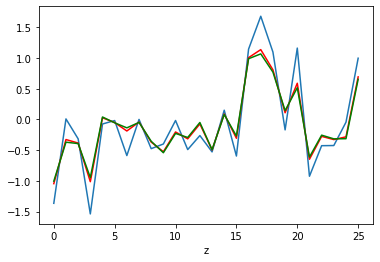

sigma_x_matlab: 0.657
sigma_x_new: 1.362

sigma_y_matlab: 2.448
sigma_y_new: 2.410

sigma_z_matlab: 0.595
sigma_z_new: 0.352
sigma_z_oil: 0.324
sigma_z_multfact: 0.239
z_mult: 2.046874019239818

PARTICLE ID:  31
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


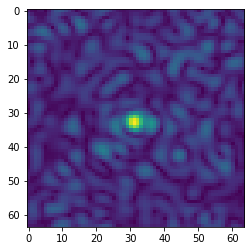

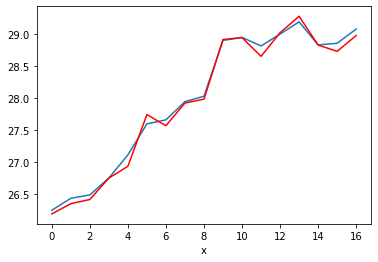

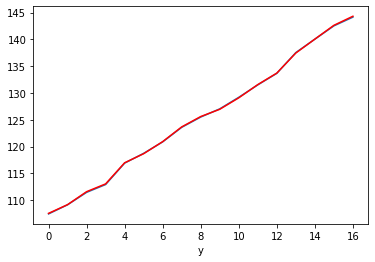

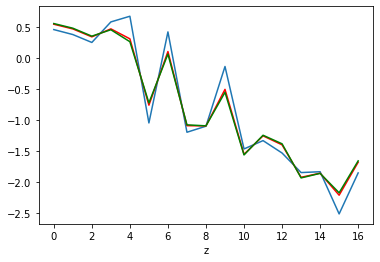

sigma_x_matlab: 0.166
sigma_x_new: 0.042

sigma_y_matlab: 2.308
sigma_y_new: 2.311

sigma_z_matlab: 0.683
sigma_z_new: 0.444
sigma_z_oil: 0.413
sigma_z_multfact: 0.300
z_mult: 2.8477806171780107

PARTICLE ID:  32
training images shape (28, 64, 64, 2)
validation images shape (28, 64, 64, 1)


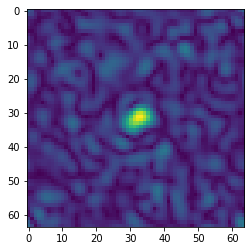

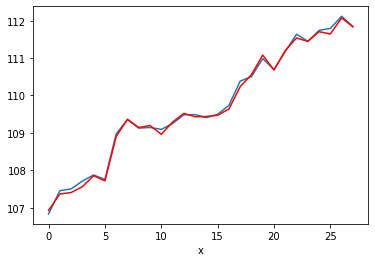

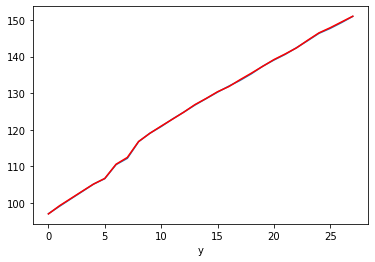

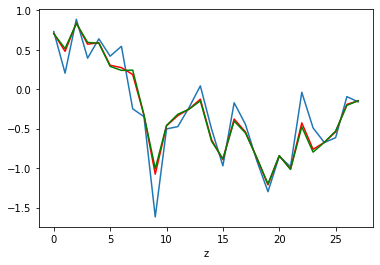

sigma_x_matlab: 0.117
sigma_x_new: 0.105

sigma_y_matlab: 1.996
sigma_y_new: 2.003

sigma_z_matlab: 0.340
sigma_z_new: 0.142
sigma_z_oil: 0.121
sigma_z_multfact: 0.087
z_mult: 1.5286795523091574

PARTICLE ID:  33
training images shape (83, 64, 64, 2)
validation images shape (83, 64, 64, 1)


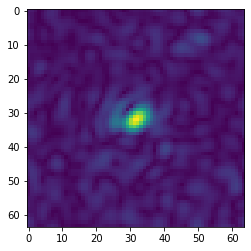

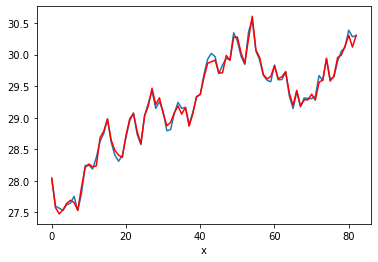

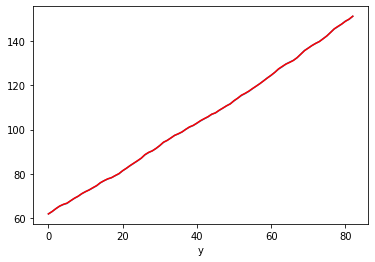

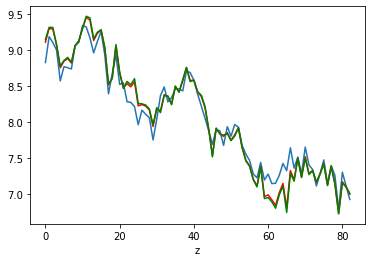

sigma_x_matlab: 0.045
sigma_x_new: 0.016

sigma_y_matlab: 1.093
sigma_y_new: 1.093

sigma_z_matlab: 0.107
sigma_z_new: 0.111
sigma_z_oil: 0.115
sigma_z_multfact: 0.131
z_mult: 0.39998552501974877

PARTICLE ID:  34
training images shape (28, 64, 64, 2)
validation images shape (28, 64, 64, 1)


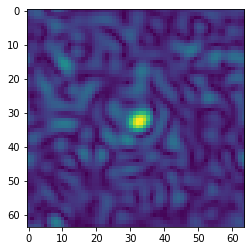

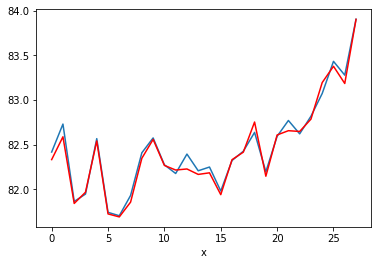

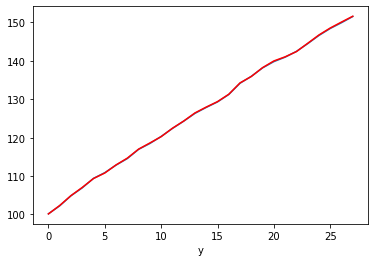

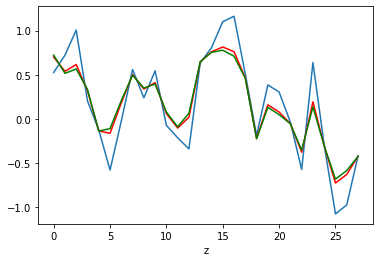

sigma_x_matlab: 0.196
sigma_x_new: 0.203

sigma_y_matlab: 1.907
sigma_y_new: 1.911

sigma_z_matlab: 0.180
sigma_z_new: 0.020
sigma_z_oil: 0.035
sigma_z_multfact: 0.051
z_mult: 0.9585372331250155

PARTICLE ID:  35
training images shape (21, 64, 64, 2)
validation images shape (21, 64, 64, 1)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  


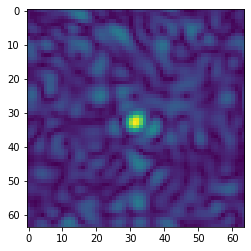

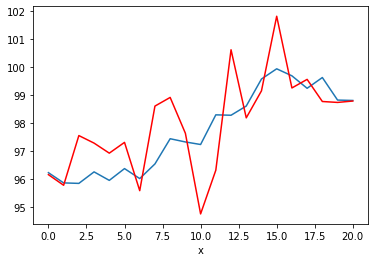

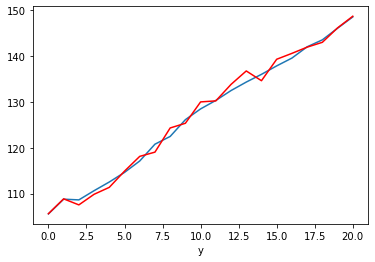

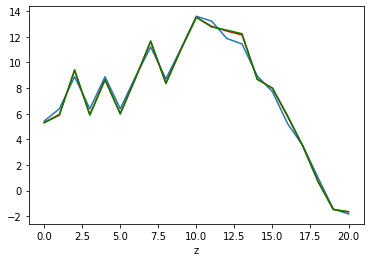

sigma_x_matlab: 0.075
sigma_x_new: 0.992

sigma_y_matlab: 2.080
sigma_y_new: 1.587

sigma_z_matlab: 0.146
sigma_z_new: 0.892
sigma_z_oil: 0.959
sigma_z_multfact: 1.190
z_mult: 0.03110432640495204

PARTICLE ID:  36
training images shape (16, 64, 64, 2)
validation images shape (16, 64, 64, 1)


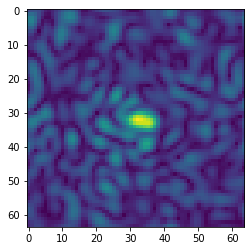

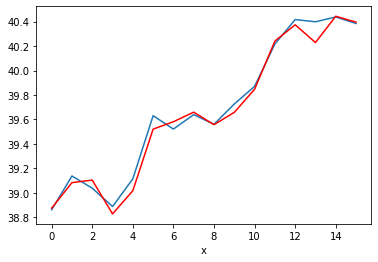

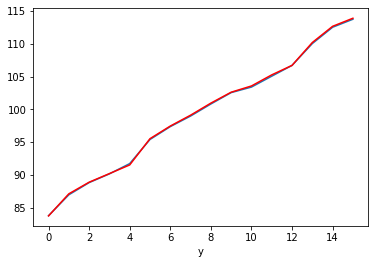

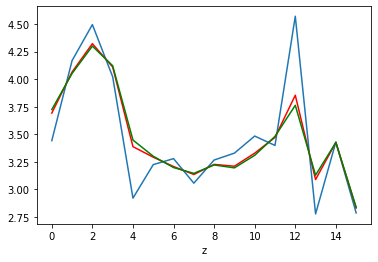

sigma_x_matlab: 0.091
sigma_x_new: 0.101

sigma_y_matlab: 1.985
sigma_y_new: 1.976

sigma_z_matlab: 0.504
sigma_z_new: 0.172
sigma_z_oil: 0.121
sigma_z_multfact: 0.111
z_mult: 2.0197535013373553

PARTICLE ID:  37
training images shape (21, 64, 64, 2)
validation images shape (21, 64, 64, 1)


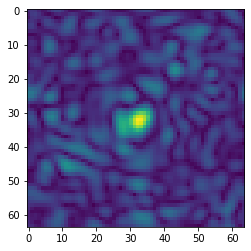

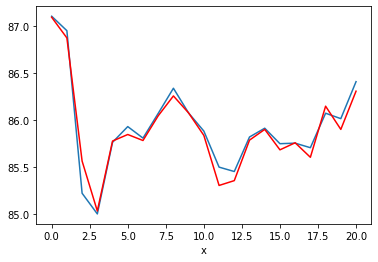

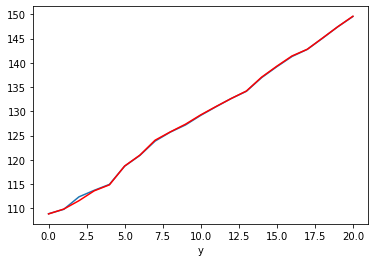

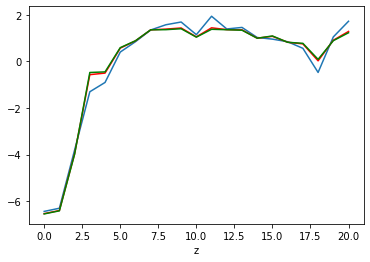

sigma_x_matlab: 0.183
sigma_x_new: 0.159

sigma_y_matlab: 2.041
sigma_y_new: 2.051

sigma_z_matlab: 0.644
sigma_z_new: 0.685
sigma_z_oil: 0.687
sigma_z_multfact: 0.690
z_mult: -2.6865226974512315

PARTICLE ID:  38
training images shape (18, 64, 64, 2)
validation images shape (18, 64, 64, 1)


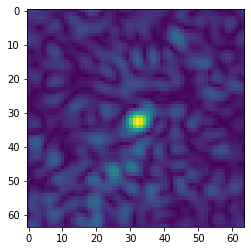

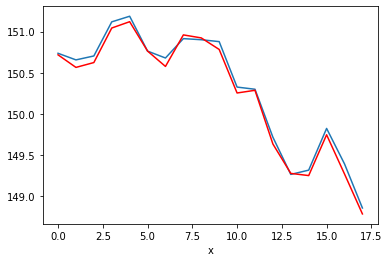

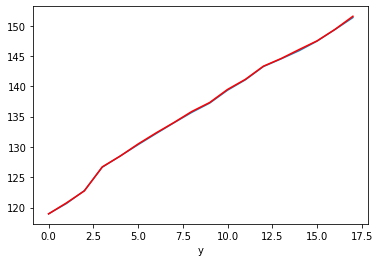

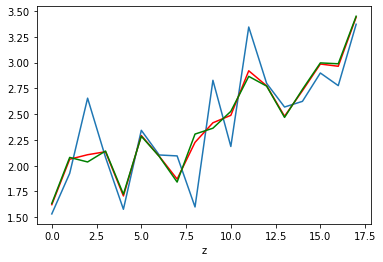

sigma_x_matlab: 0.148
sigma_x_new: 0.129

sigma_y_matlab: 1.917
sigma_y_new: 1.913

sigma_z_matlab: 0.444
sigma_z_new: 0.143
sigma_z_oil: 0.161
sigma_z_multfact: 0.317
z_mult: 0.9561806573520684

PARTICLE ID:  39
training images shape (27, 64, 64, 2)
validation images shape (27, 64, 64, 1)


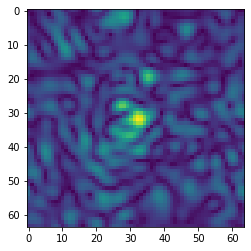

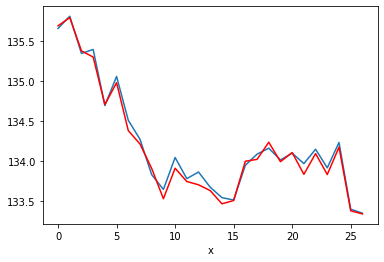

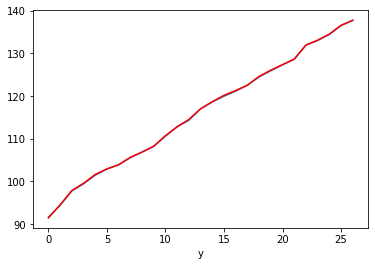

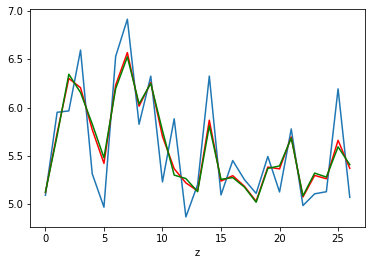

sigma_x_matlab: 0.178
sigma_x_new: 0.175

sigma_y_matlab: 1.769
sigma_y_new: 1.779

sigma_z_matlab: 0.537
sigma_z_new: 0.182
sigma_z_oil: 0.156
sigma_z_multfact: 0.196
z_mult: 1.2738203354190831

PARTICLE ID:  40
training images shape (30, 64, 64, 2)
validation images shape (30, 64, 64, 1)


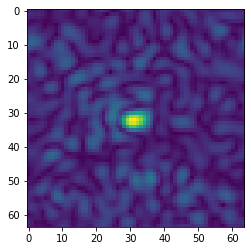

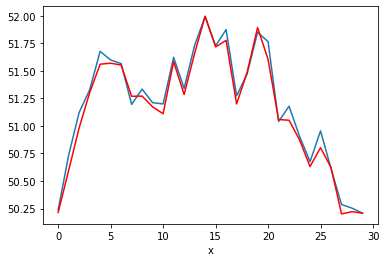

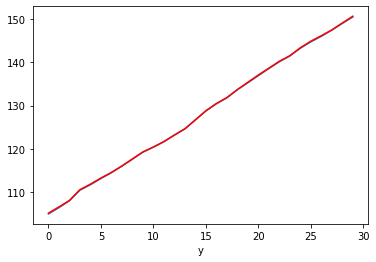

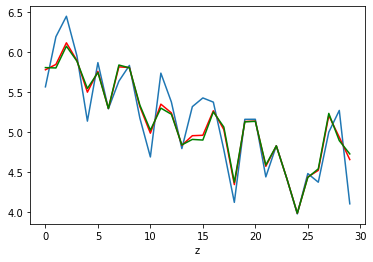

sigma_x_matlab: 0.083
sigma_x_new: 0.060

sigma_y_matlab: 1.580
sigma_y_new: 1.580

sigma_z_matlab: 0.297
sigma_z_new: 0.204
sigma_z_oil: 0.200
sigma_z_multfact: 0.208
z_mult: 1.2480955039567436

PARTICLE ID:  41
training images shape (21, 64, 64, 2)
validation images shape (21, 64, 64, 1)


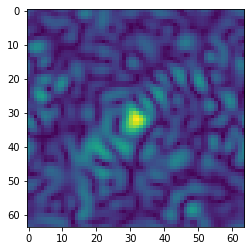

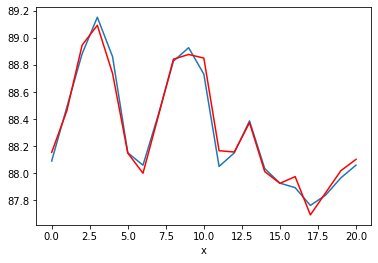

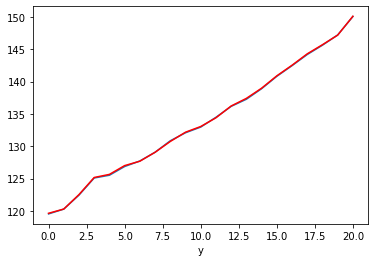

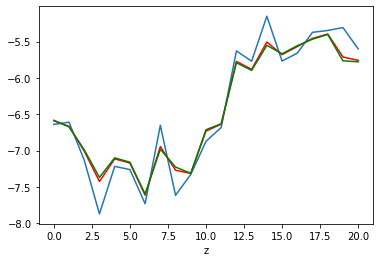

sigma_x_matlab: 0.185
sigma_x_new: 0.169

sigma_y_matlab: 1.503
sigma_y_new: 1.498

sigma_z_matlab: 0.339
sigma_z_new: 0.170
sigma_z_oil: 0.155
sigma_z_multfact: 0.136
z_mult: 1.5052238156907418

PARTICLE ID:  42
training images shape (20, 64, 64, 2)
validation images shape (20, 64, 64, 1)


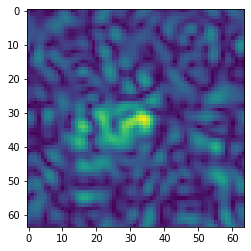

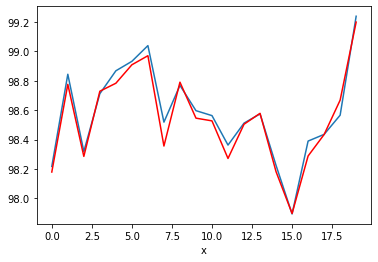

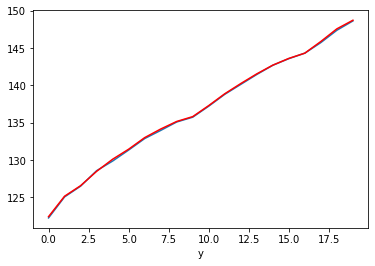

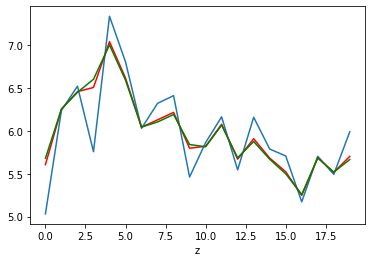

sigma_x_matlab: 0.190
sigma_x_new: 0.201

sigma_y_matlab: 1.363
sigma_y_new: 1.367

sigma_z_matlab: 0.426
sigma_z_new: 0.129
sigma_z_oil: 0.082
sigma_z_multfact: 0.088
z_mult: 1.8775103502939388

PARTICLE ID:  43
training images shape (29, 64, 64, 2)
validation images shape (29, 64, 64, 1)


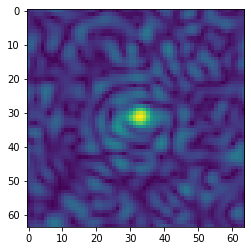

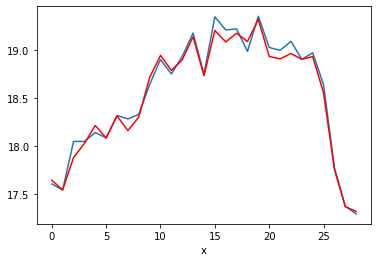

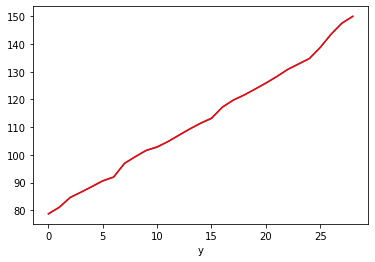

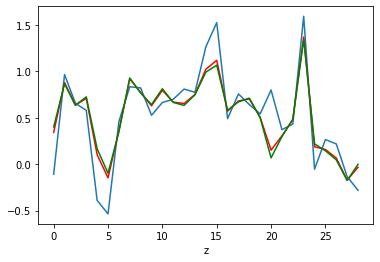

sigma_x_matlab: 0.026
sigma_x_new: 0.088

sigma_y_matlab: 2.581
sigma_y_new: 2.585

sigma_z_matlab: 0.324
sigma_z_new: 0.180
sigma_z_oil: 0.166
sigma_z_multfact: 0.130
z_mult: 1.7570920208820315

PARTICLE ID:  44
training images shape (25, 64, 64, 2)
validation images shape (25, 64, 64, 1)


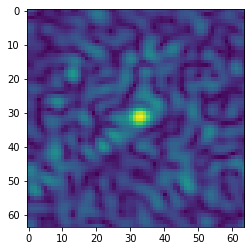

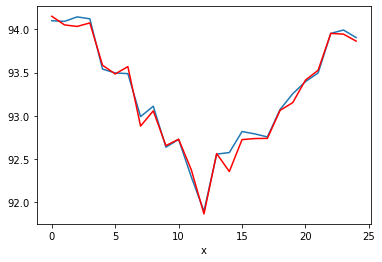

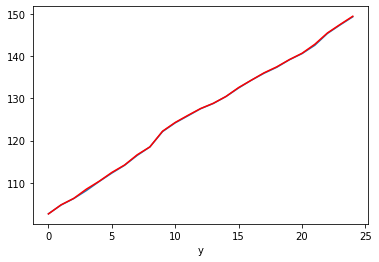

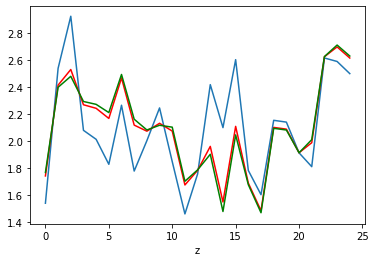

sigma_x_matlab: 0.062
sigma_x_new: 0.154

sigma_y_matlab: 1.955
sigma_y_new: 1.955

sigma_z_matlab: 0.198
sigma_z_new: 0.158
sigma_z_oil: 0.152
sigma_z_multfact: 0.131
z_mult: 3.23225224792334

PARTICLE ID:  45
training images shape (40, 64, 64, 2)
validation images shape (40, 64, 64, 1)


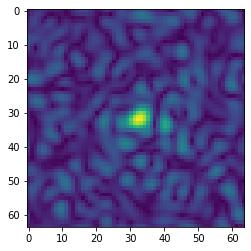

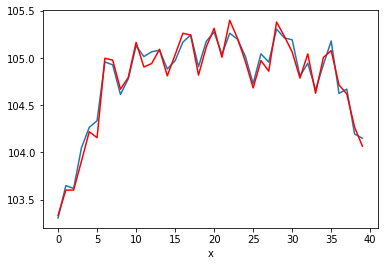

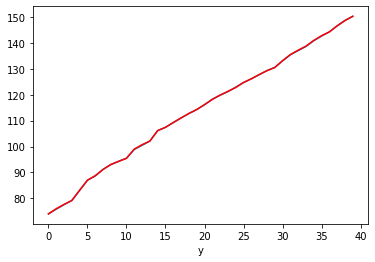

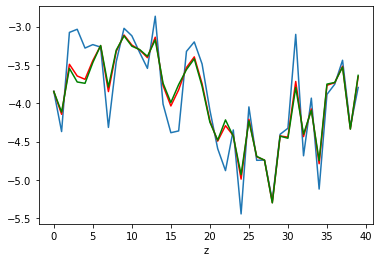

sigma_x_matlab: 0.110
sigma_x_new: 0.137

sigma_y_matlab: 1.967
sigma_y_new: 1.958

sigma_z_matlab: 0.523
sigma_z_new: 0.327
sigma_z_oil: 0.307
sigma_z_multfact: 0.251
z_mult: 1.9201099709125486

PARTICLE ID:  46
training images shape (22, 64, 64, 2)
validation images shape (22, 64, 64, 1)


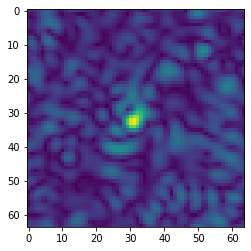

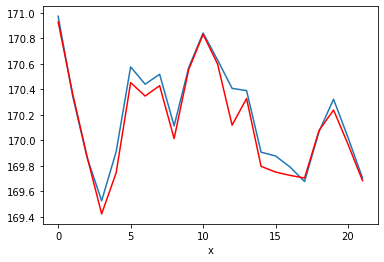

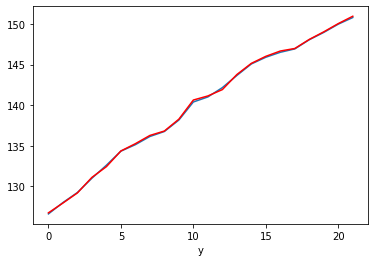

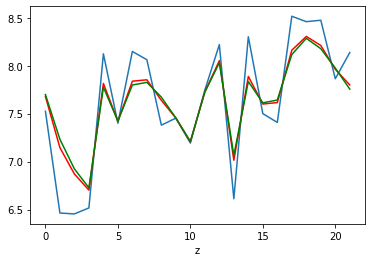

sigma_x_matlab: 0.159
sigma_x_new: 0.130

sigma_y_matlab: 1.170
sigma_y_new: 1.166

sigma_z_matlab: 0.577
sigma_z_new: 0.303
sigma_z_oil: 0.269
sigma_z_multfact: 0.161
z_mult: 1.9622837348700362

PARTICLE ID:  47
training images shape (24, 64, 64, 2)
validation images shape (24, 64, 64, 1)


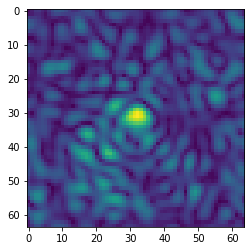

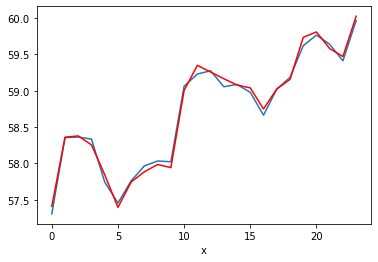

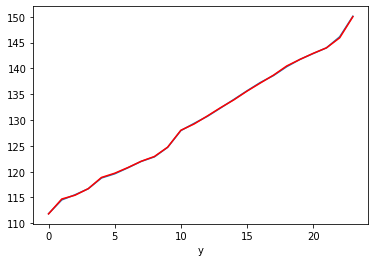

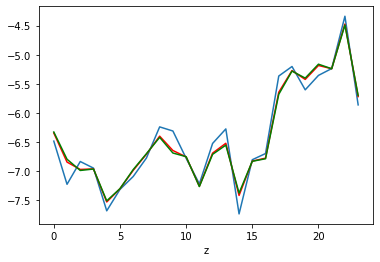

sigma_x_matlab: 0.122
sigma_x_new: 0.150

sigma_y_matlab: 1.602
sigma_y_new: 1.576

sigma_z_matlab: 0.356
sigma_z_new: 0.242
sigma_z_oil: 0.229
sigma_z_multfact: 0.192
z_mult: 2.2072849065824323

PARTICLE ID:  48
training images shape (44, 64, 64, 2)
validation images shape (44, 64, 64, 1)


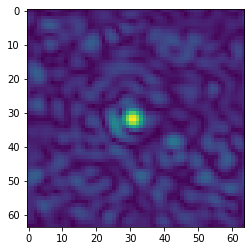

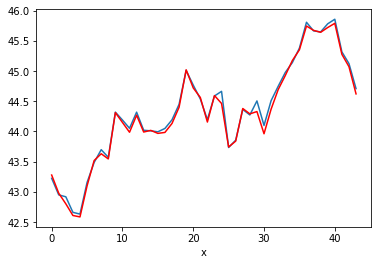

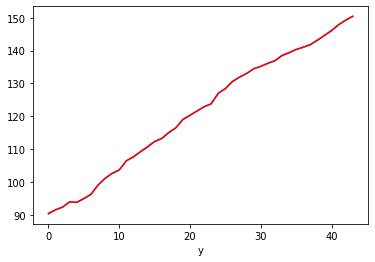

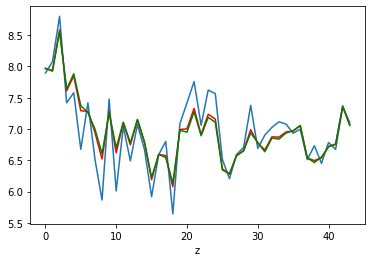

sigma_x_matlab: 0.013
sigma_x_new: 0.086

sigma_y_matlab: 1.404
sigma_y_new: 1.404

sigma_z_matlab: 0.509
sigma_z_new: 0.281
sigma_z_oil: 0.256
sigma_z_multfact: 0.187
z_mult: 1.8485277117110812

PARTICLE ID:  49
training images shape (26, 64, 64, 2)
validation images shape (26, 64, 64, 1)


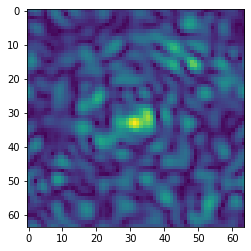

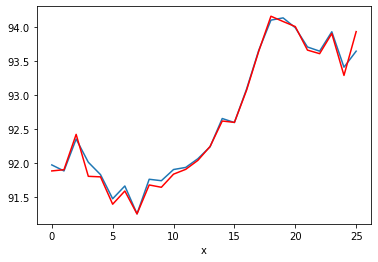

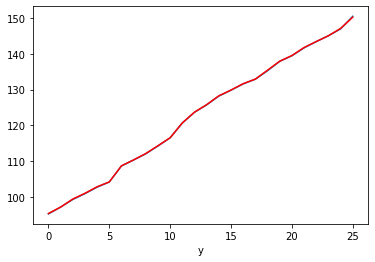

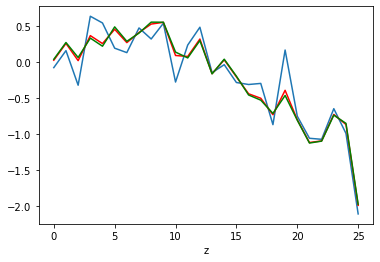

sigma_x_matlab: 0.057
sigma_x_new: 0.147

sigma_y_matlab: 2.190
sigma_y_new: 2.182

sigma_z_matlab: 0.321
sigma_z_new: 0.129
sigma_z_oil: 0.113
sigma_z_multfact: 0.108
z_mult: 1.3861029138447873

PARTICLE ID:  50
training images shape (32, 64, 64, 2)
validation images shape (32, 64, 64, 1)


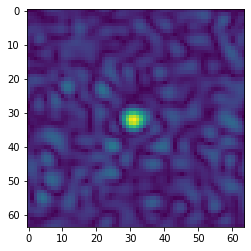

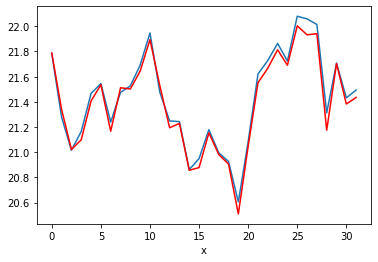

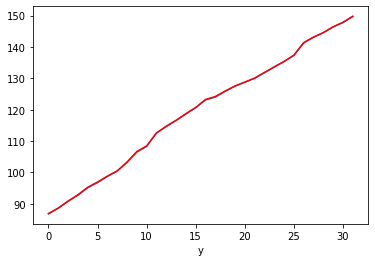

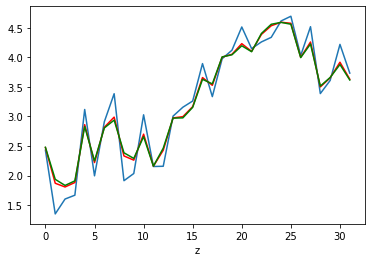

sigma_x_matlab: 0.076
sigma_x_new: 0.130

sigma_y_matlab: 2.037
sigma_y_new: 2.046

sigma_z_matlab: 0.441
sigma_z_new: 0.233
sigma_z_oil: 0.205
sigma_z_multfact: 0.087
z_mult: 2.862659829111208

PARTICLE ID:  51
training images shape (19, 64, 64, 2)
validation images shape (19, 64, 64, 1)


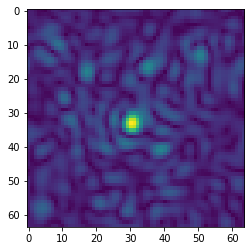

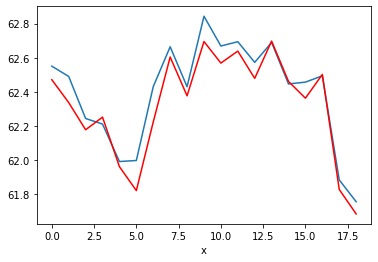

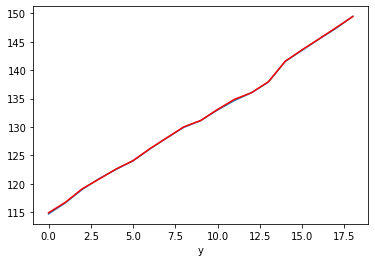

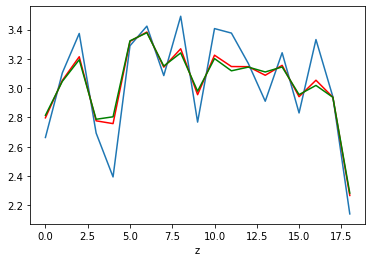

sigma_x_matlab: 0.072
sigma_x_new: 0.100

sigma_y_matlab: 1.929
sigma_y_new: 1.919

sigma_z_matlab: 0.267
sigma_z_new: 0.098
sigma_z_oil: 0.078
sigma_z_multfact: 0.037
z_mult: 1.528616499941175

PARTICLE ID:  52
training images shape (18, 64, 64, 2)
validation images shape (18, 64, 64, 1)


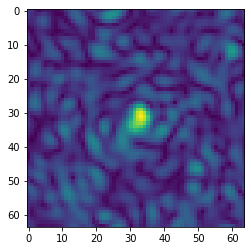

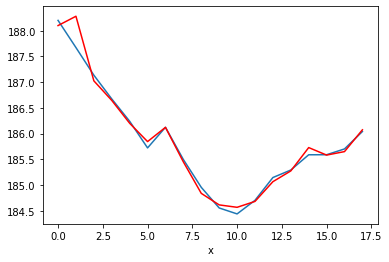

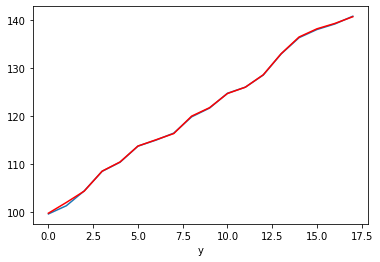

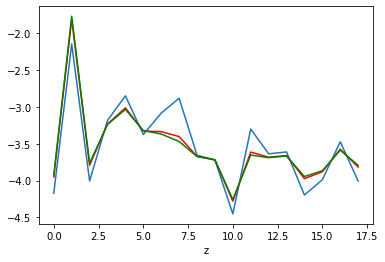

sigma_x_matlab: 0.289
sigma_x_new: 0.252

sigma_y_matlab: 2.471
sigma_y_new: 2.440

sigma_z_matlab: 0.657
sigma_z_new: 0.599
sigma_z_oil: 0.594
sigma_z_multfact: 0.581
z_mult: 2.0997421943569345

PARTICLE ID:  53
training images shape (16, 64, 64, 2)
validation images shape (16, 64, 64, 1)


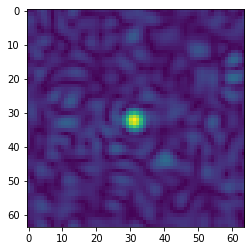

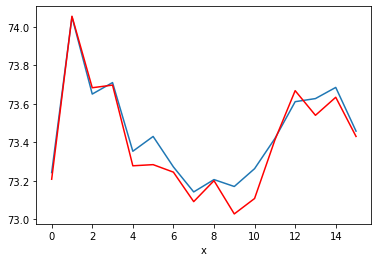

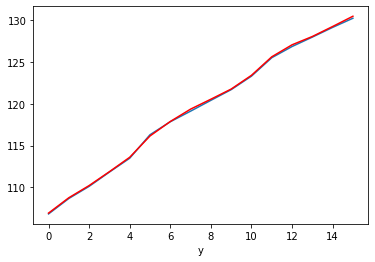

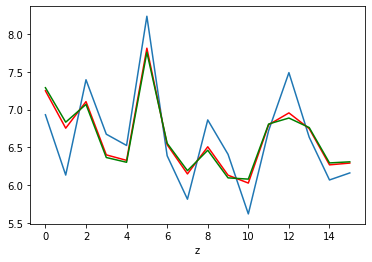

sigma_x_matlab: 0.162
sigma_x_new: 0.154

sigma_y_matlab: 1.579
sigma_y_new: 1.590

sigma_z_matlab: 0.606
sigma_z_new: 0.380
sigma_z_oil: 0.353
sigma_z_multfact: 0.260
z_mult: 2.3820073300804143

PARTICLE ID:  54
training images shape (41, 64, 64, 2)
validation images shape (41, 64, 64, 1)


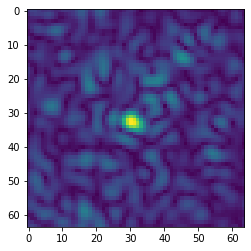

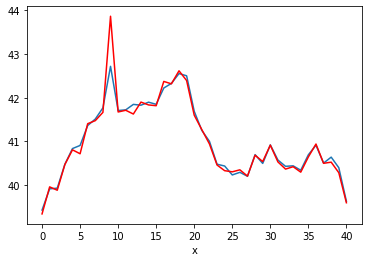

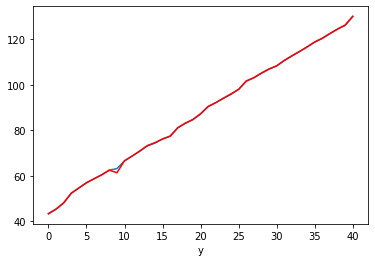

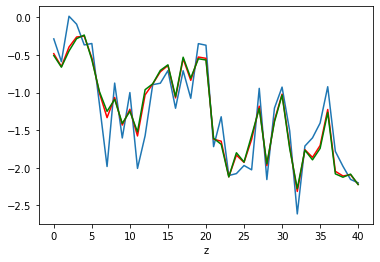

sigma_x_matlab: 0.032
sigma_x_new: 0.322

sigma_y_matlab: 2.138
sigma_y_new: 2.081

sigma_z_matlab: 0.420
sigma_z_new: 0.212
sigma_z_oil: 0.193
sigma_z_multfact: 0.162
z_mult: 1.5522074981068545

PARTICLE ID:  55
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


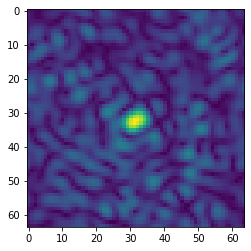

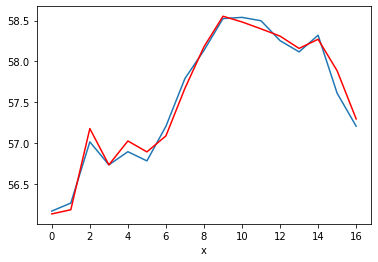

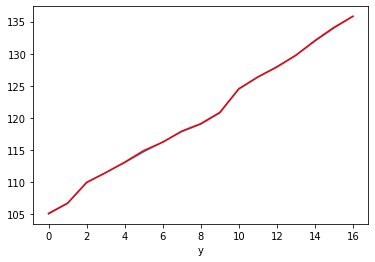

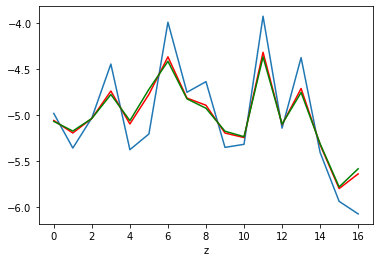

sigma_x_matlab: 0.182
sigma_x_new: 0.110

sigma_y_matlab: 1.924
sigma_y_new: 1.922

sigma_z_matlab: 0.535
sigma_z_new: 0.292
sigma_z_oil: 0.265
sigma_z_multfact: 0.181
z_mult: 1.9219362907116382

PARTICLE ID:  56
training images shape (24, 64, 64, 2)
validation images shape (24, 64, 64, 1)


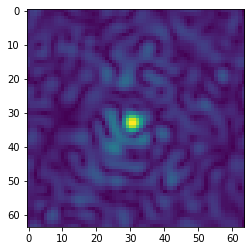

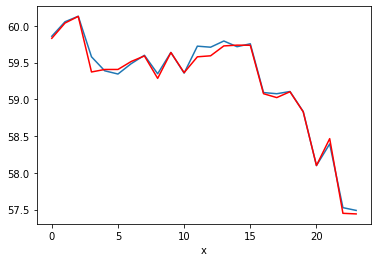

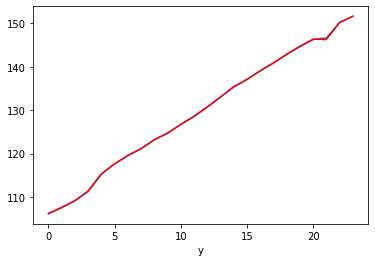

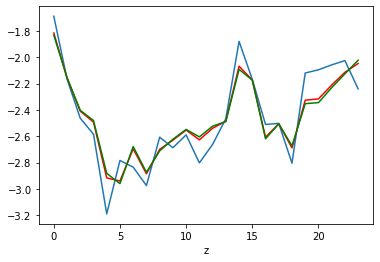

sigma_x_matlab: 0.146
sigma_x_new: 0.187

sigma_y_matlab: 1.983
sigma_y_new: 1.962

sigma_z_matlab: 0.112
sigma_z_new: 0.019
sigma_z_oil: 0.023
sigma_z_multfact: 0.067
z_mult: 1.0127857781428014

PARTICLE ID:  57
training images shape (22, 64, 64, 2)
validation images shape (22, 64, 64, 1)


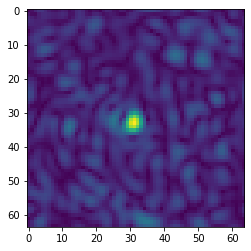

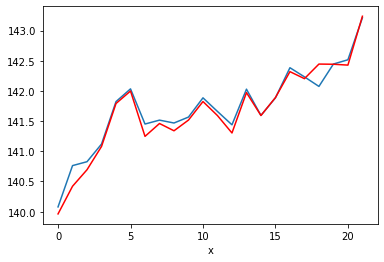

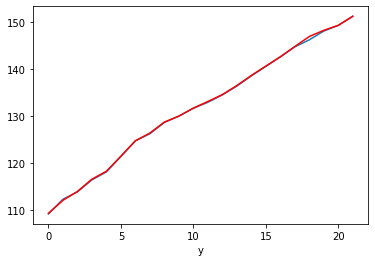

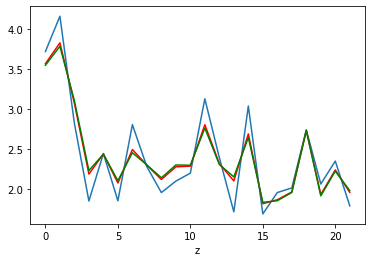

sigma_x_matlab: 0.085
sigma_x_new: 0.095

sigma_y_matlab: 1.982
sigma_y_new: 1.999

sigma_z_matlab: 0.503
sigma_z_new: 0.296
sigma_z_oil: 0.273
sigma_z_multfact: 0.211
z_mult: 1.9158626883962393

PARTICLE ID:  58
training images shape (25, 64, 64, 2)
validation images shape (25, 64, 64, 1)


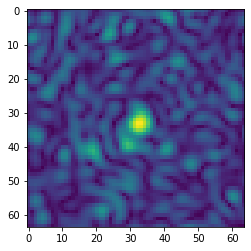

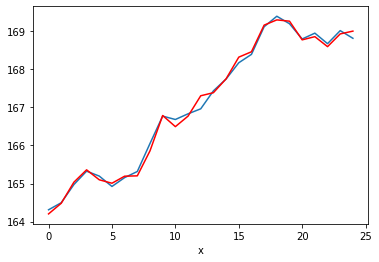

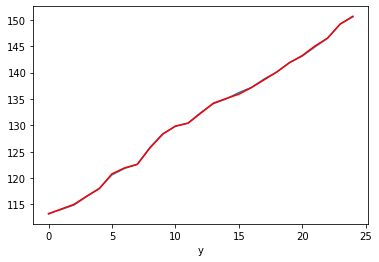

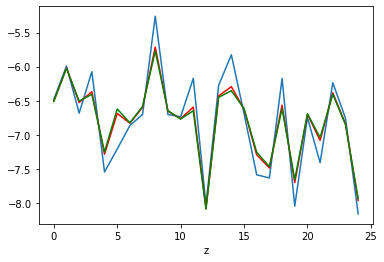

sigma_x_matlab: 0.243
sigma_x_new: 0.220

sigma_y_matlab: 1.583
sigma_y_new: 1.582

sigma_z_matlab: 0.771
sigma_z_new: 0.540
sigma_z_oil: 0.513
sigma_z_multfact: 0.424
z_mult: 2.583316166882856

PARTICLE ID:  59
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


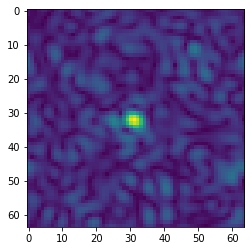

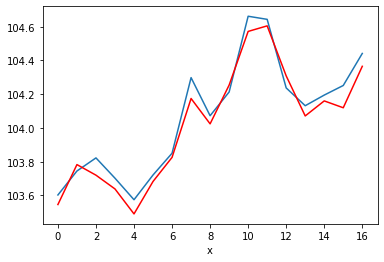

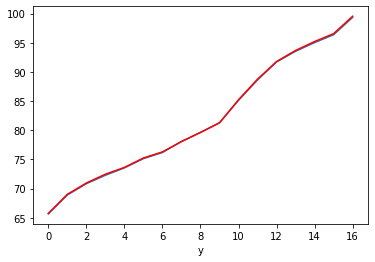

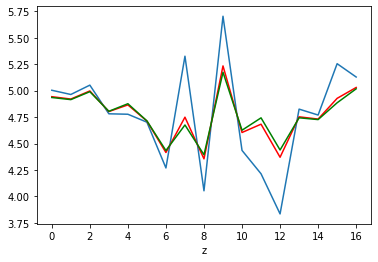

sigma_x_matlab: 0.061
sigma_x_new: 0.070

sigma_y_matlab: 2.117
sigma_y_new: 2.126

sigma_z_matlab: 0.640
sigma_z_new: 0.295
sigma_z_oil: 0.252
sigma_z_multfact: 0.108
z_mult: 1.8125419075157447

PARTICLE ID:  60
training images shape (42, 64, 64, 2)
validation images shape (42, 64, 64, 1)


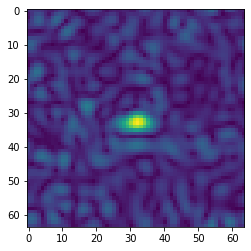

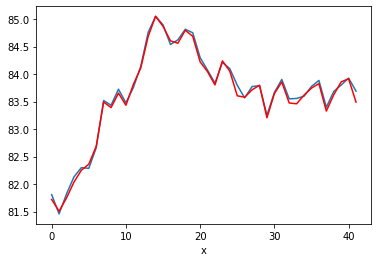

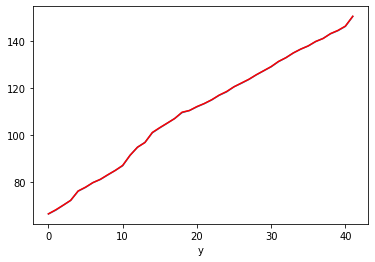

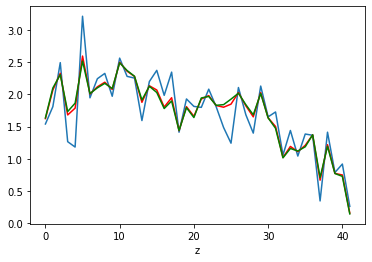

sigma_x_matlab: 0.096
sigma_x_new: 0.087

sigma_y_matlab: 2.047
sigma_y_new: 2.045

sigma_z_matlab: 0.471
sigma_z_new: 0.225
sigma_z_oil: 0.196
sigma_z_multfact: 0.102
z_mult: 1.821372887319888

PARTICLE ID:  61
training images shape (25, 64, 64, 2)
validation images shape (25, 64, 64, 1)


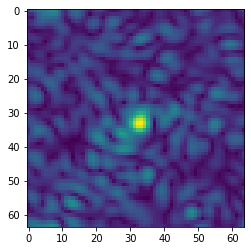

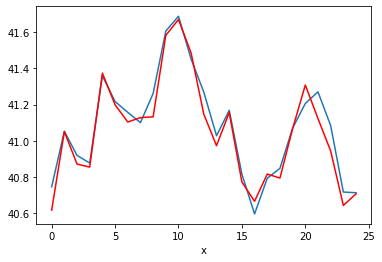

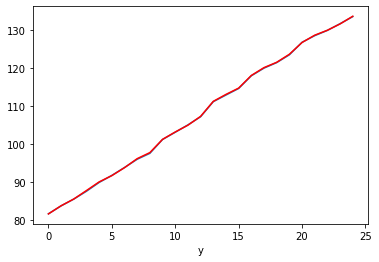

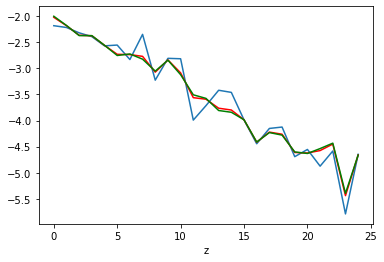

sigma_x_matlab: 0.066
sigma_x_new: 0.022

sigma_y_matlab: 2.151
sigma_y_new: 2.158

sigma_z_matlab: 0.360
sigma_z_new: 0.185
sigma_z_oil: 0.169
sigma_z_multfact: 0.143
z_mult: 1.5475316797670413

PARTICLE ID:  62
training images shape (20, 64, 64, 2)
validation images shape (20, 64, 64, 1)


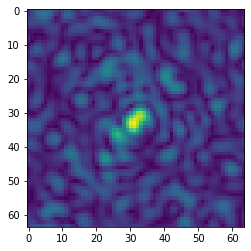

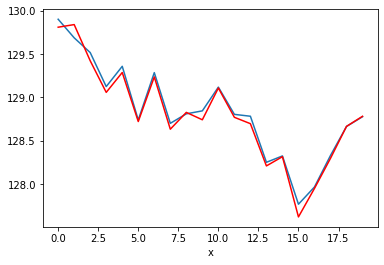

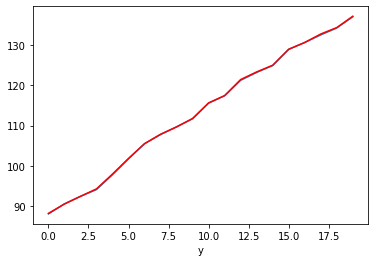

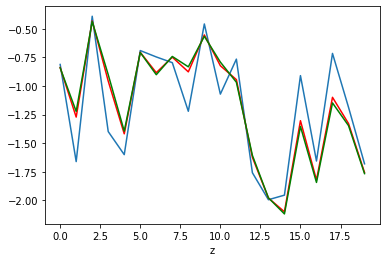

sigma_x_matlab: 0.220
sigma_x_new: 0.232

sigma_y_matlab: 2.555
sigma_y_new: 2.554

sigma_z_matlab: 0.531
sigma_z_new: 0.311
sigma_z_oil: 0.286
sigma_z_multfact: 0.209
z_mult: 2.0325021504626792

PARTICLE ID:  63
training images shape (72, 64, 64, 2)
validation images shape (72, 64, 64, 1)


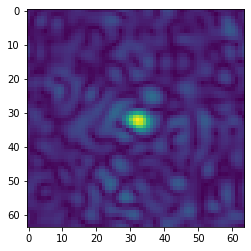

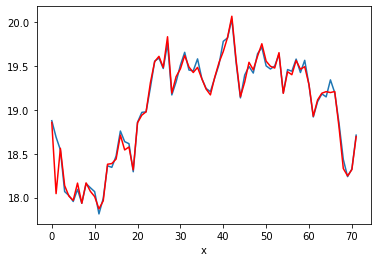

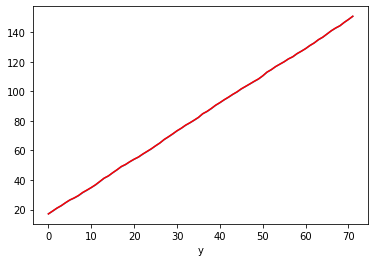

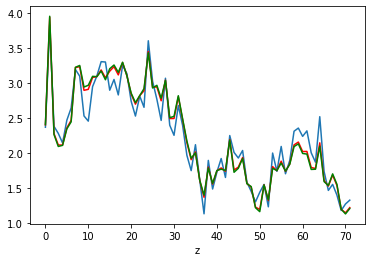

sigma_x_matlab: 0.035
sigma_x_new: 0.114

sigma_y_matlab: 1.877
sigma_y_new: 1.875

sigma_z_matlab: 0.269
sigma_z_new: 0.220
sigma_z_oil: 0.215
sigma_z_multfact: 0.206
z_mult: 1.8378825185263343

PARTICLE ID:  64
training images shape (23, 64, 64, 2)
validation images shape (23, 64, 64, 1)


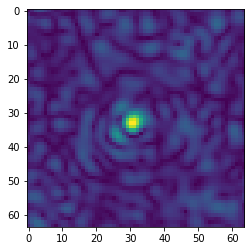

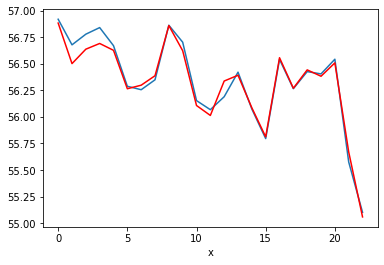

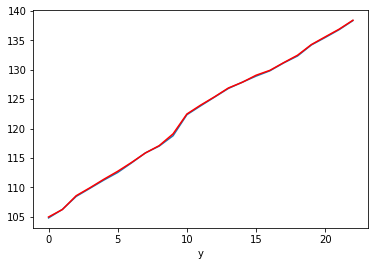

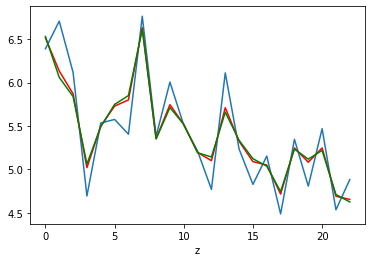

sigma_x_matlab: 0.044
sigma_x_new: 0.046

sigma_y_matlab: 1.537
sigma_y_new: 1.540

sigma_z_matlab: 0.602
sigma_z_new: 0.307
sigma_z_oil: 0.272
sigma_z_multfact: 0.162
z_mult: 1.892866933811094

PARTICLE ID:  65
training images shape (29, 64, 64, 2)
validation images shape (29, 64, 64, 1)


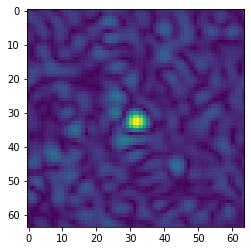

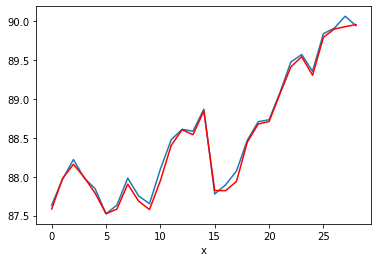

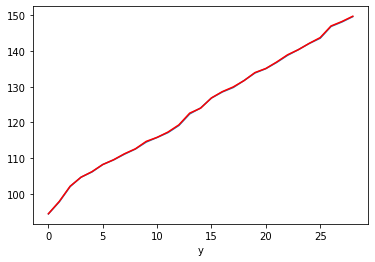

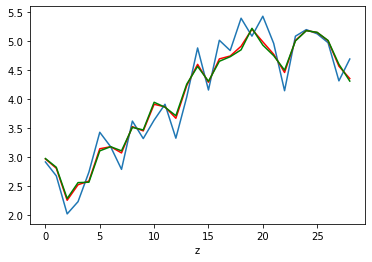

sigma_x_matlab: 0.044
sigma_x_new: 0.093

sigma_y_matlab: 1.988
sigma_y_new: 1.981

sigma_z_matlab: 0.304
sigma_z_new: 0.046
sigma_z_oil: 0.015
sigma_z_multfact: 0.096
z_mult: 1.3043518774130514

PARTICLE ID:  66
training images shape (34, 64, 64, 2)
validation images shape (34, 64, 64, 1)


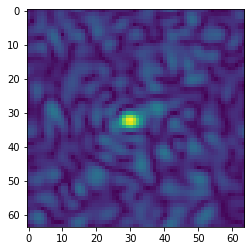

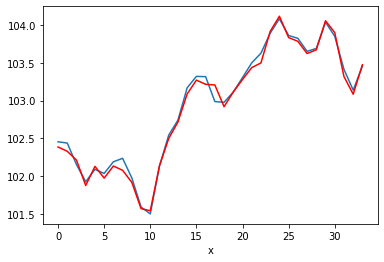

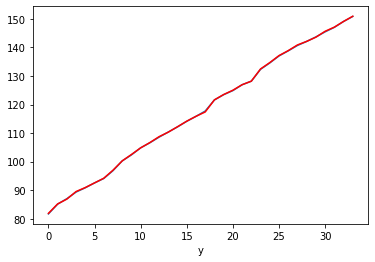

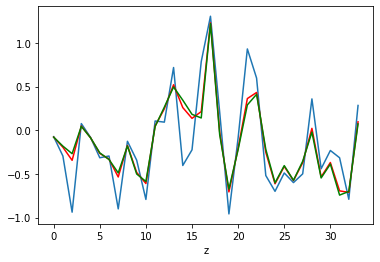

sigma_x_matlab: 0.156
sigma_x_new: 0.131

sigma_y_matlab: 2.077
sigma_y_new: 2.064

sigma_z_matlab: 0.269
sigma_z_new: 0.150
sigma_z_oil: 0.160
sigma_z_multfact: 0.233
z_mult: 0.8899903571827846

PARTICLE ID:  67
training images shape (34, 64, 64, 2)
validation images shape (34, 64, 64, 1)


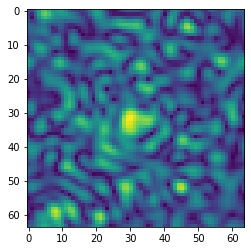

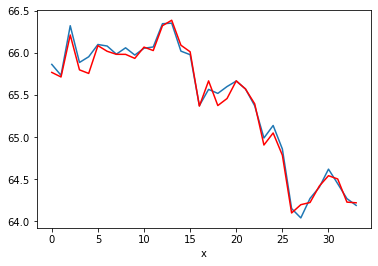

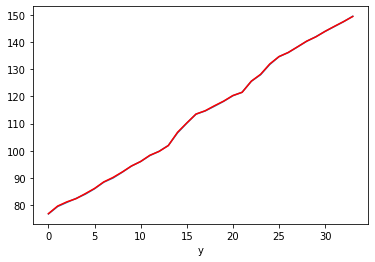

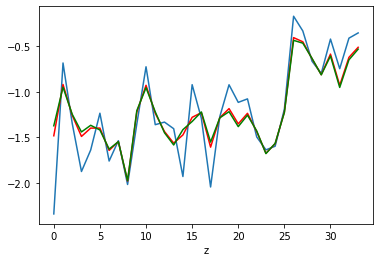

sigma_x_matlab: 0.068
sigma_x_new: 0.106

sigma_y_matlab: 2.235
sigma_y_new: 2.228

sigma_z_matlab: 0.272
sigma_z_new: 0.097
sigma_z_oil: 0.086
sigma_z_multfact: 0.110
z_mult: 1.2473153196544045

PARTICLE ID:  68
training images shape (76, 64, 64, 2)
validation images shape (76, 64, 64, 1)


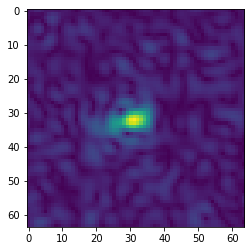

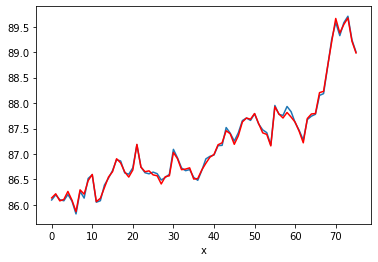

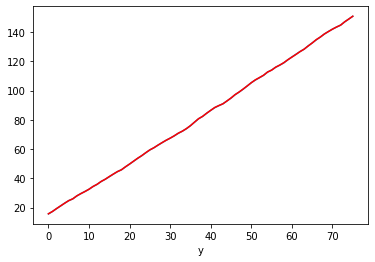

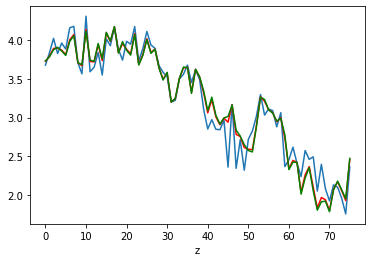

sigma_x_matlab: 0.020
sigma_x_new: 0.031

sigma_y_matlab: 1.808
sigma_y_new: 1.805

sigma_z_matlab: 0.219
sigma_z_new: 0.107
sigma_z_oil: 0.101
sigma_z_multfact: 0.109
z_mult: 1.288700180631702

PARTICLE ID:  69
training images shape (27, 64, 64, 2)
validation images shape (27, 64, 64, 1)


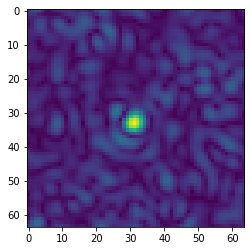

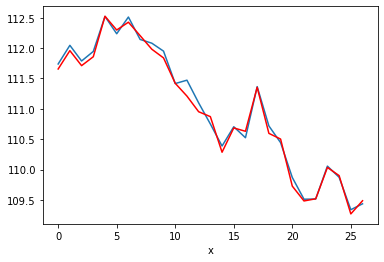

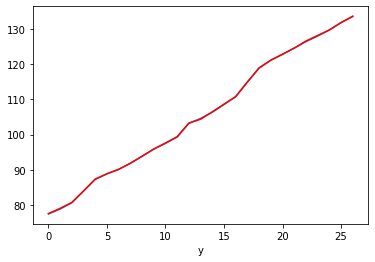

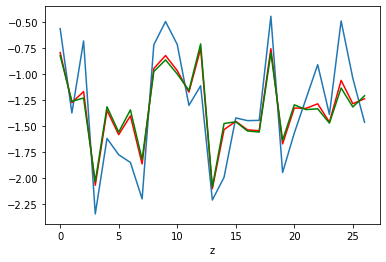

sigma_x_matlab: 0.134
sigma_x_new: 0.141

sigma_y_matlab: 2.219
sigma_y_new: 2.205

sigma_z_matlab: 0.499
sigma_z_new: 0.399
sigma_z_oil: 0.392
sigma_z_multfact: 0.380
z_mult: 1.5912187030508682

PARTICLE ID:  70
training images shape (30, 64, 64, 2)
validation images shape (30, 64, 64, 1)


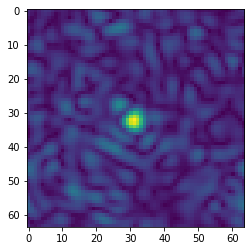

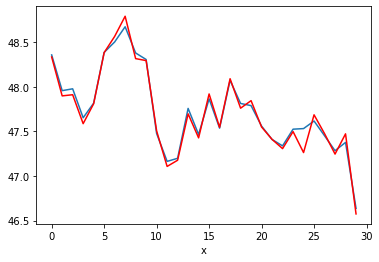

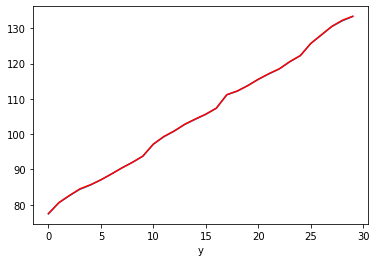

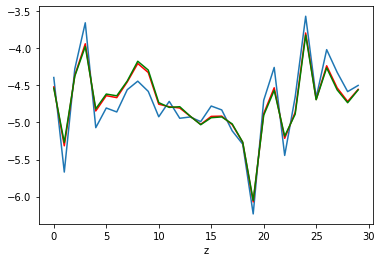

sigma_x_matlab: 0.110
sigma_x_new: 0.176

sigma_y_matlab: 1.918
sigma_y_new: 1.925

sigma_z_matlab: 0.441
sigma_z_new: 0.313
sigma_z_oil: 0.298
sigma_z_multfact: 0.249
z_mult: 2.601546825420536

PARTICLE ID:  71
training images shape (18, 64, 64, 2)
validation images shape (18, 64, 64, 1)


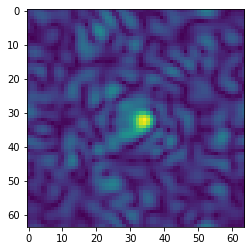

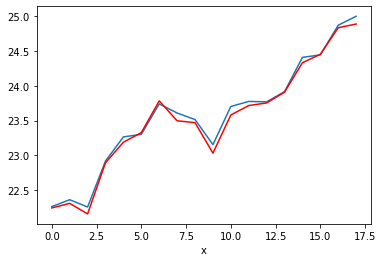

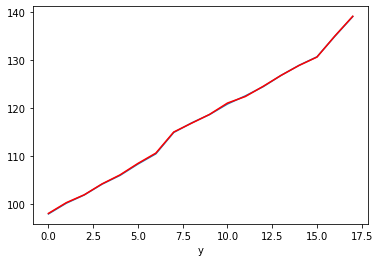

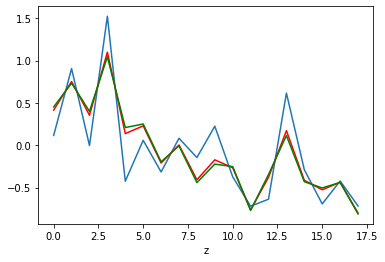

sigma_x_matlab: 0.102
sigma_x_new: 0.085

sigma_y_matlab: 2.398
sigma_y_new: 2.390

sigma_z_matlab: 0.681
sigma_z_new: 0.336
sigma_z_oil: 0.297
sigma_z_multfact: 0.196
z_mult: 1.7389509845376179

PARTICLE ID:  72
training images shape (20, 64, 64, 2)
validation images shape (20, 64, 64, 1)


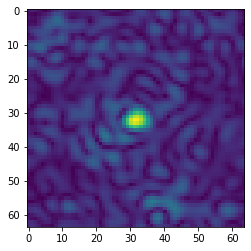

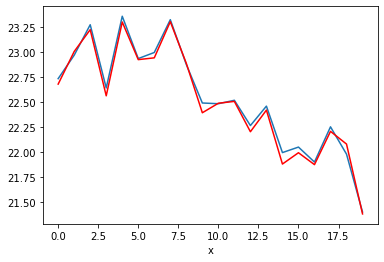

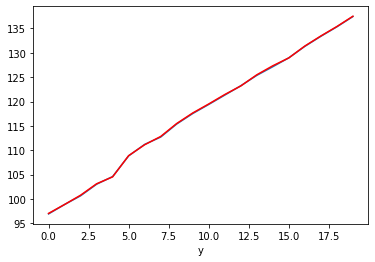

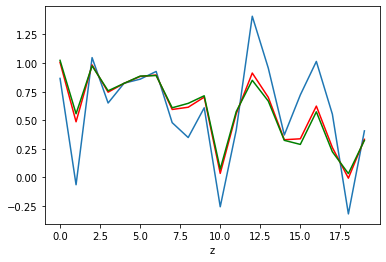

sigma_x_matlab: 0.239
sigma_x_new: 0.246

sigma_y_matlab: 2.124
sigma_y_new: 2.118

sigma_z_matlab: 0.360
sigma_z_new: 0.199
sigma_z_oil: 0.184
sigma_z_multfact: 0.151
z_mult: 1.6616379894677091

PARTICLE ID:  73
training images shape (18, 64, 64, 2)
validation images shape (18, 64, 64, 1)


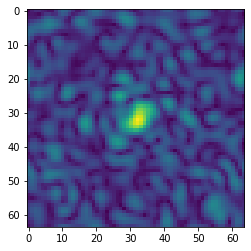

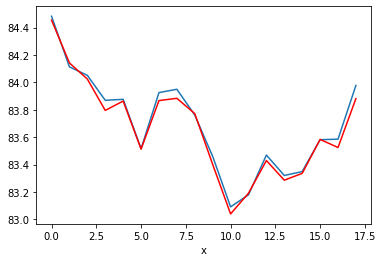

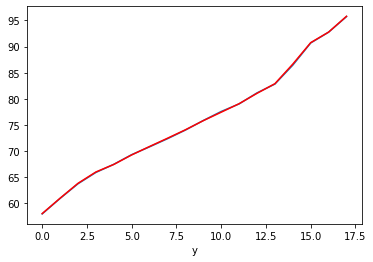

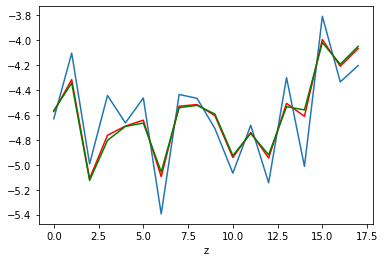

sigma_x_matlab: 0.026
sigma_x_new: 0.016

sigma_y_matlab: 2.234
sigma_y_new: 2.238

sigma_z_matlab: 0.559
sigma_z_new: 0.269
sigma_z_oil: 0.233
sigma_z_multfact: 0.100
z_mult: 1.914776575587772

PARTICLE ID:  74
training images shape (22, 64, 64, 2)
validation images shape (22, 64, 64, 1)


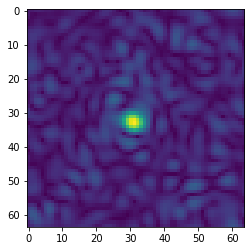

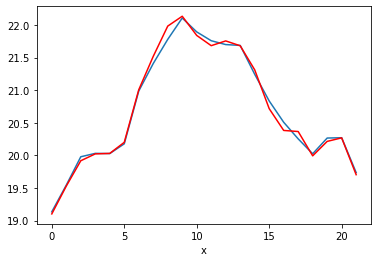

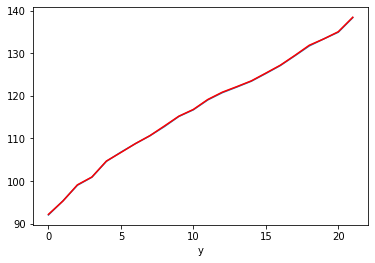

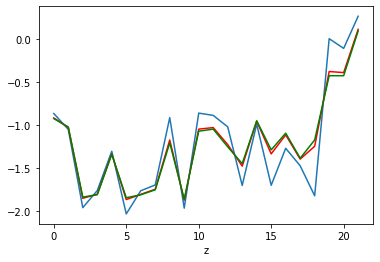

sigma_x_matlab: 0.256
sigma_x_new: 0.265

sigma_y_matlab: 2.164
sigma_y_new: 2.162

sigma_z_matlab: 0.473
sigma_z_new: 0.273
sigma_z_oil: 0.250
sigma_z_multfact: 0.187
z_mult: 1.924731368915331

PARTICLE ID:  75
training images shape (24, 64, 64, 2)
validation images shape (24, 64, 64, 1)


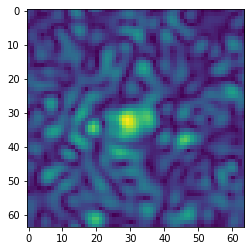

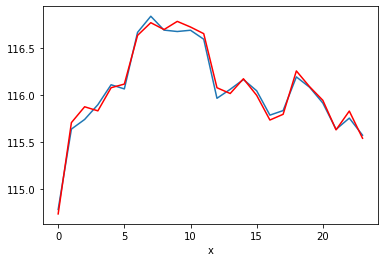

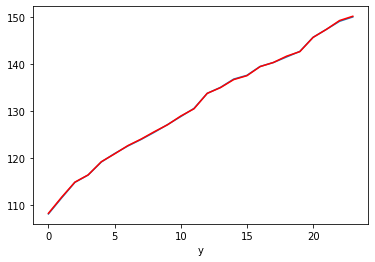

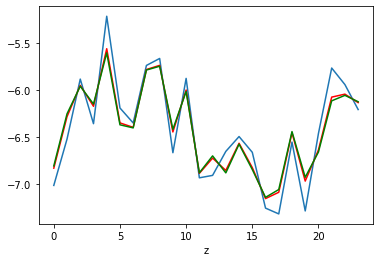

sigma_x_matlab: 0.091
sigma_x_new: 0.094

sigma_y_matlab: 1.827
sigma_y_new: 1.810

sigma_z_matlab: 0.416
sigma_z_new: 0.276
sigma_z_oil: 0.261
sigma_z_multfact: 0.214
z_mult: 2.1893601700768515

PARTICLE ID:  76
training images shape (20, 64, 64, 2)
validation images shape (20, 64, 64, 1)


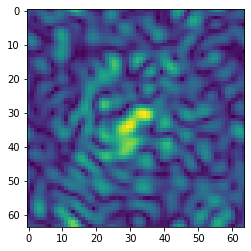

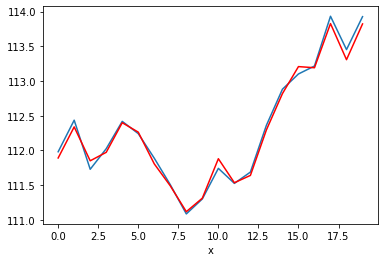

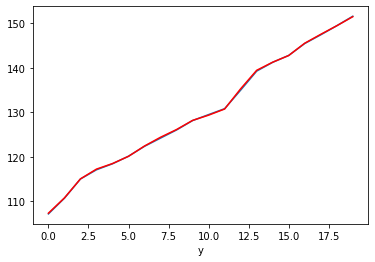

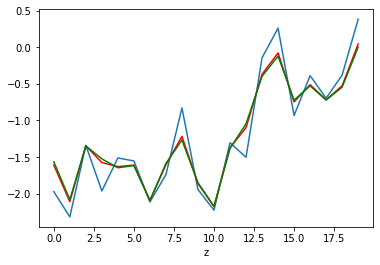

sigma_x_matlab: 0.089
sigma_x_new: 0.093

sigma_y_matlab: 2.374
sigma_y_new: 2.368

sigma_z_matlab: 0.416
sigma_z_new: 0.182
sigma_z_oil: 0.156
sigma_z_multfact: 0.093
z_mult: 1.632064912425948

PARTICLE ID:  77
training images shape (33, 64, 64, 2)
validation images shape (33, 64, 64, 1)


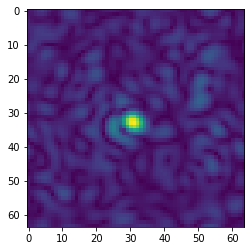

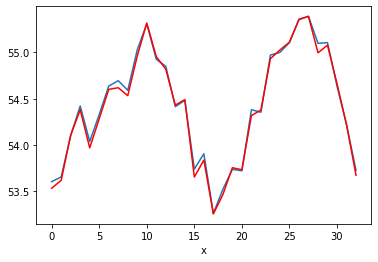

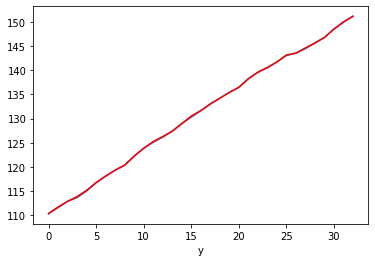

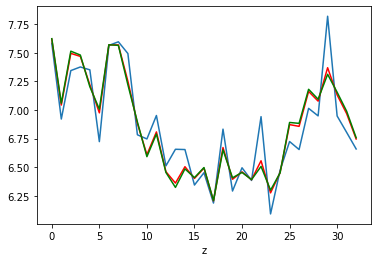

sigma_x_matlab: 0.035
sigma_x_new: 0.084

sigma_y_matlab: 1.279
sigma_y_new: 1.276

sigma_z_matlab: 0.313
sigma_z_new: 0.146
sigma_z_oil: 0.130
sigma_z_multfact: 0.108
z_mult: 1.5134998909140984

PARTICLE ID:  78
training images shape (68, 64, 64, 2)
validation images shape (68, 64, 64, 1)


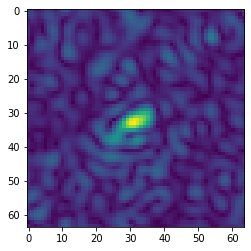

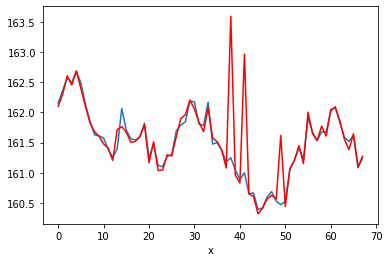

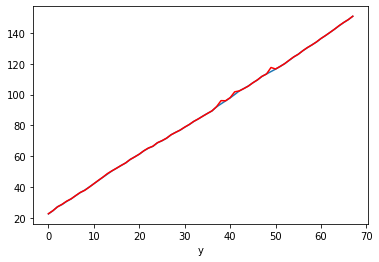

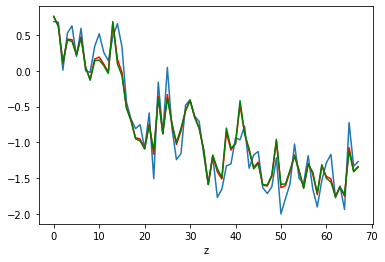

sigma_x_matlab: 0.101
sigma_x_new: 0.484

sigma_y_matlab: 1.905
sigma_y_new: 1.858

sigma_z_matlab: 0.312
sigma_z_new: 0.207
sigma_z_oil: 0.203
sigma_z_multfact: 0.214
z_mult: 1.229157891802175

PARTICLE ID:  79
training images shape (18, 64, 64, 2)
validation images shape (18, 64, 64, 1)


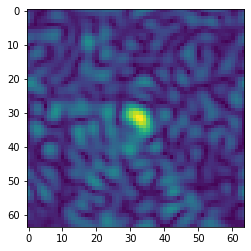

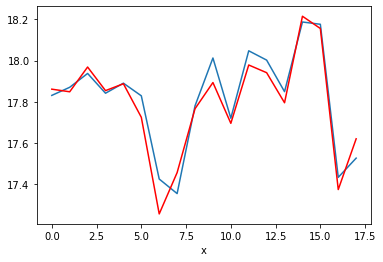

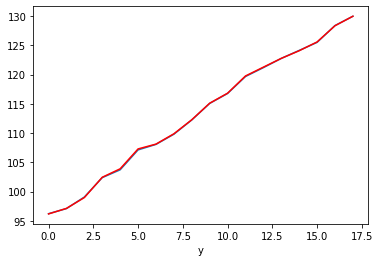

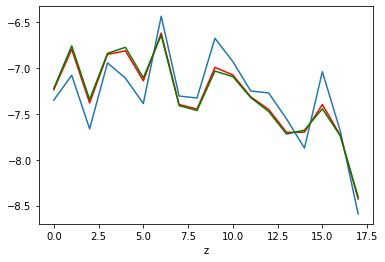

sigma_x_matlab: 0.105
sigma_x_new: 0.127

sigma_y_matlab: 1.975
sigma_y_new: 1.979

sigma_z_matlab: 0.347
sigma_z_new: 0.242
sigma_z_oil: 0.232
sigma_z_multfact: 0.206
z_mult: 1.9017529212410267

PARTICLE ID:  80
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


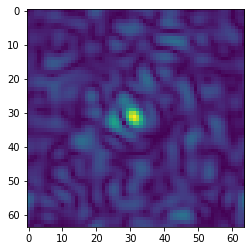

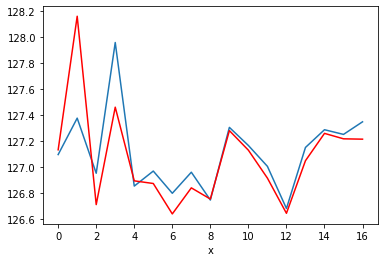

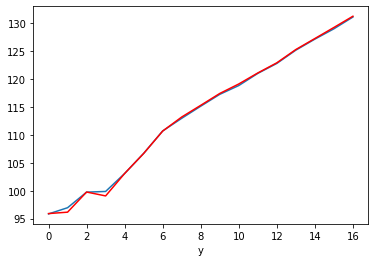

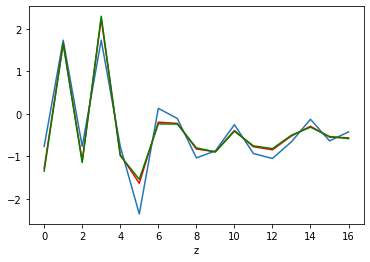

sigma_x_matlab: 0.373
sigma_x_new: 0.455

sigma_y_matlab: 2.248
sigma_y_new: 2.188

sigma_z_matlab: 1.146
sigma_z_new: 1.343
sigma_z_oil: 1.376
sigma_z_multfact: 1.510
z_mult: -0.7867947830875577

PARTICLE ID:  81
training images shape (18, 64, 64, 2)
validation images shape (18, 64, 64, 1)


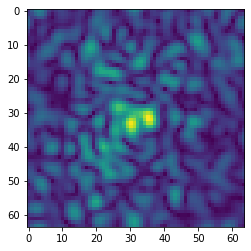

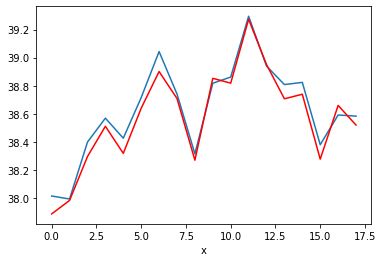

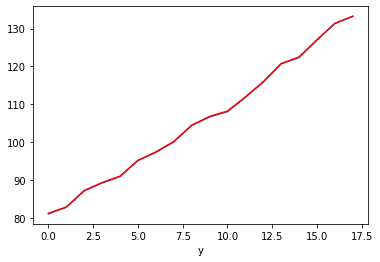

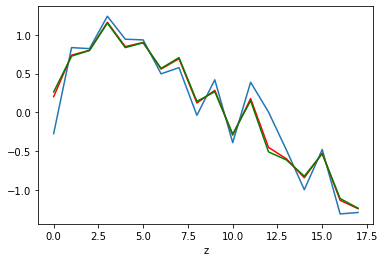

sigma_x_matlab: 0.129
sigma_x_new: 0.177

sigma_y_matlab: 3.068
sigma_y_new: 3.068

sigma_z_matlab: 0.360
sigma_z_new: 0.255
sigma_z_oil: 0.243
sigma_z_multfact: 0.200
z_mult: 2.7197984938042445

PARTICLE ID:  82
training images shape (18, 64, 64, 2)
validation images shape (18, 64, 64, 1)


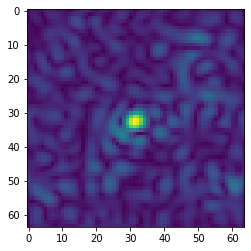

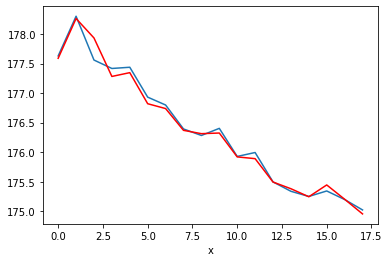

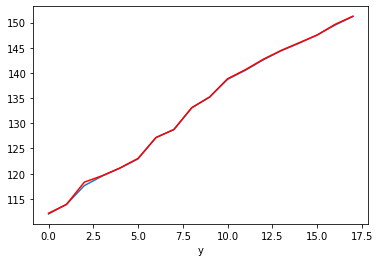

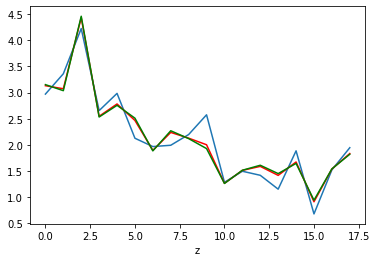

sigma_x_matlab: 0.132
sigma_x_new: 0.068

sigma_y_matlab: 2.285
sigma_y_new: 2.264

sigma_z_matlab: 0.506
sigma_z_new: 0.488
sigma_z_oil: 0.498
sigma_z_multfact: 0.551
z_mult: 0.6109477688973245

PARTICLE ID:  83
training images shape (19, 64, 64, 2)
validation images shape (19, 64, 64, 1)


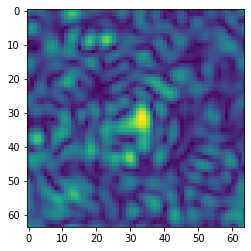

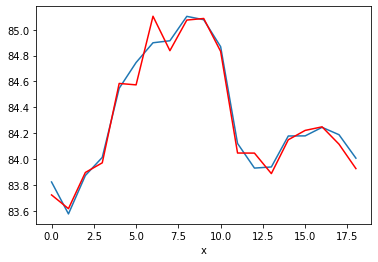

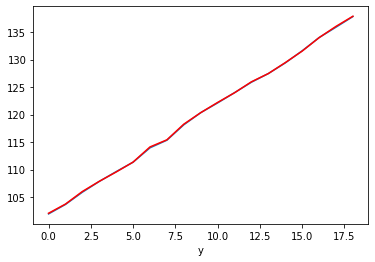

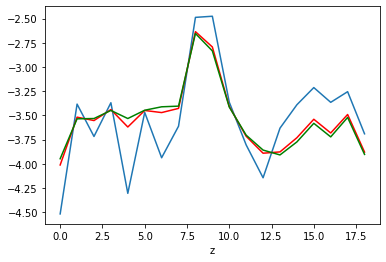

sigma_x_matlab: 0.170
sigma_x_new: 0.036

sigma_y_matlab: 1.991
sigma_y_new: 1.986

sigma_z_matlab: 0.280
sigma_z_new: 0.065
sigma_z_oil: 0.066
sigma_z_multfact: 0.126
z_mult: 1.3205579930020932

PARTICLE ID:  84
training images shape (24, 64, 64, 2)
validation images shape (24, 64, 64, 1)


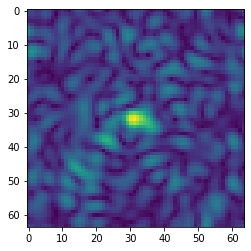

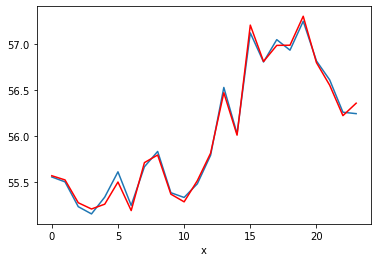

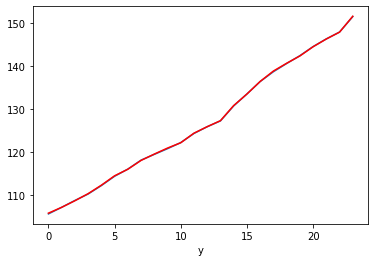

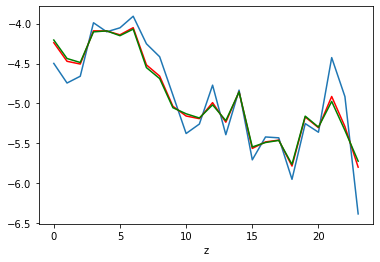

sigma_x_matlab: 0.240
sigma_x_new: 0.243

sigma_y_matlab: 1.987
sigma_y_new: 1.983

sigma_z_matlab: 0.251
sigma_z_new: 0.173
sigma_z_oil: 0.164
sigma_z_multfact: 0.131
z_mult: 2.7245287816846053

PARTICLE ID:  85
training images shape (21, 64, 64, 2)
validation images shape (21, 64, 64, 1)


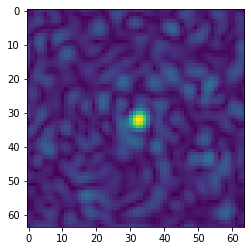

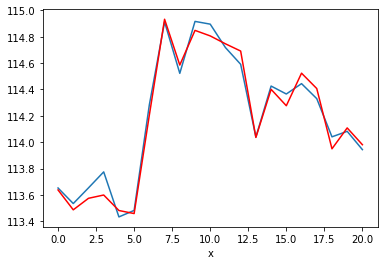

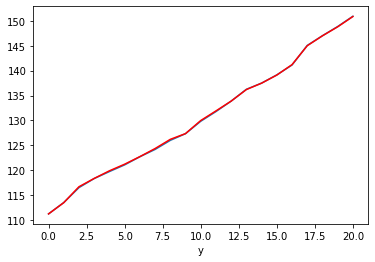

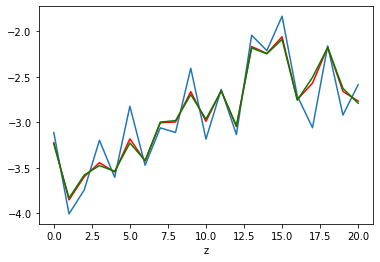

sigma_x_matlab: 0.057
sigma_x_new: 0.098

sigma_y_matlab: 1.983
sigma_y_new: 1.978

sigma_z_matlab: 0.501
sigma_z_new: 0.277
sigma_z_oil: 0.252
sigma_z_multfact: 0.186
z_mult: 1.8345007567847098

PARTICLE ID:  86
training images shape (18, 64, 64, 2)
validation images shape (18, 64, 64, 1)


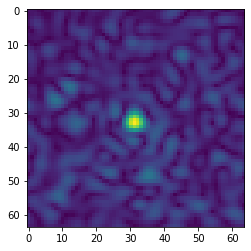

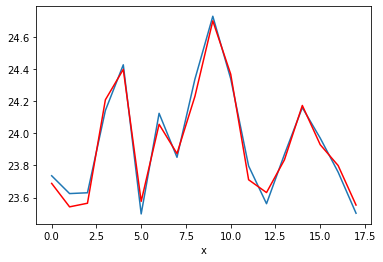

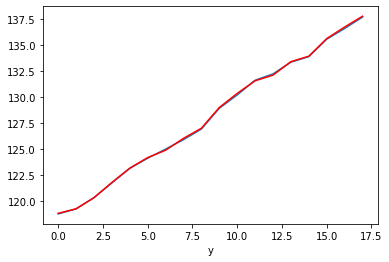

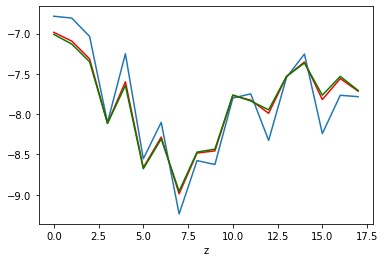

sigma_x_matlab: 0.188
sigma_x_new: 0.126

sigma_y_matlab: 1.125
sigma_y_new: 1.127

sigma_z_matlab: 0.541
sigma_z_new: 0.355
sigma_z_oil: 0.332
sigma_z_multfact: 0.248
z_mult: 2.792889366899545

PARTICLE ID:  87
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


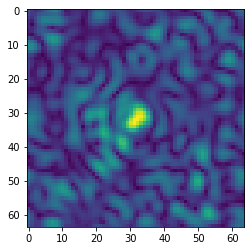

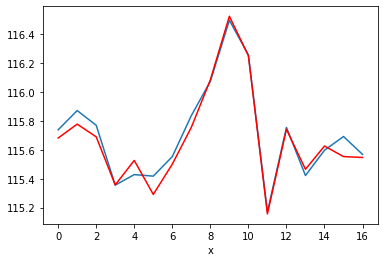

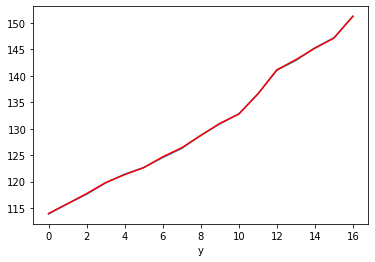

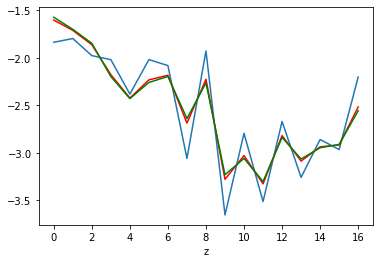

sigma_x_matlab: 0.187
sigma_x_new: 0.187

sigma_y_matlab: 2.329
sigma_y_new: 2.328

sigma_z_matlab: 0.668
sigma_z_new: 0.294
sigma_z_oil: 0.241
sigma_z_multfact: 0.101
z_mult: 1.4975986009534563

PARTICLE ID:  88
training images shape (21, 64, 64, 2)
validation images shape (21, 64, 64, 1)


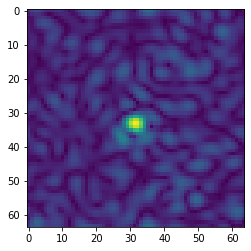

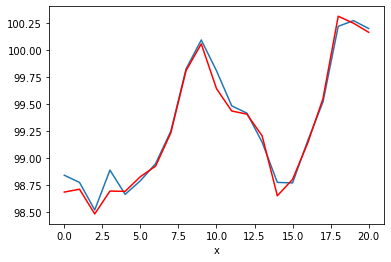

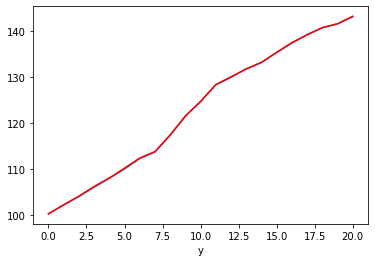

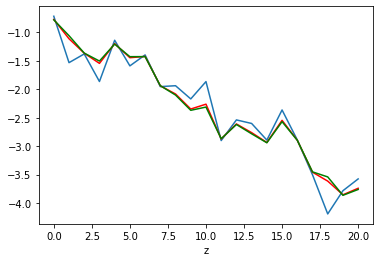

sigma_x_matlab: 0.203
sigma_x_new: 0.203

sigma_y_matlab: 2.249
sigma_y_new: 2.250

sigma_z_matlab: 0.303
sigma_z_new: 0.064
sigma_z_oil: 0.019
sigma_z_multfact: 0.032
z_mult: 1.1437595962968508

PARTICLE ID:  89
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


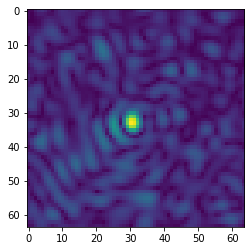

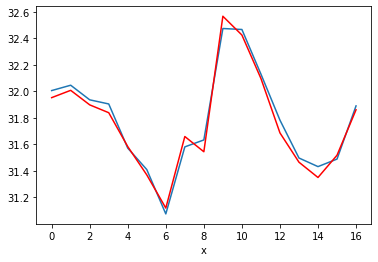

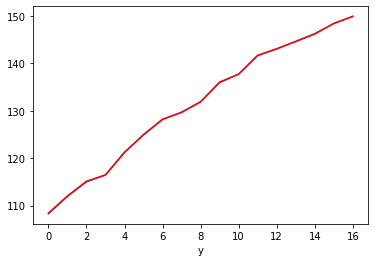

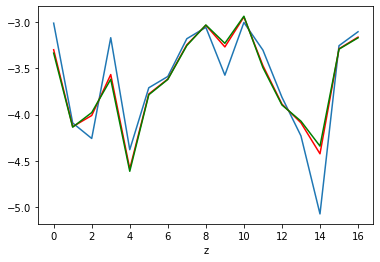

sigma_x_matlab: 0.134
sigma_x_new: 0.004

sigma_y_matlab: 2.590
sigma_y_new: 2.575

sigma_z_matlab: 0.447
sigma_z_new: 0.284
sigma_z_oil: 0.263
sigma_z_multfact: 0.189
z_mult: 2.6358004434232534

PARTICLE ID:  90
training images shape (17, 64, 64, 2)
validation images shape (17, 64, 64, 1)


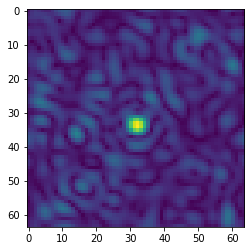

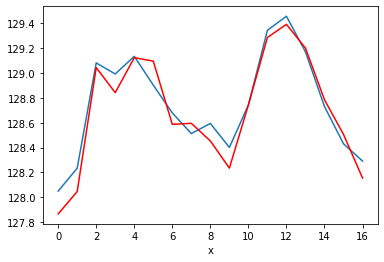

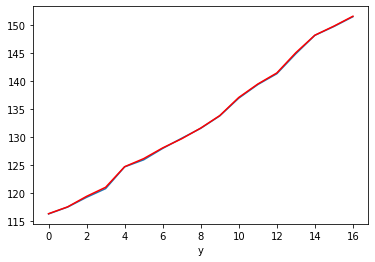

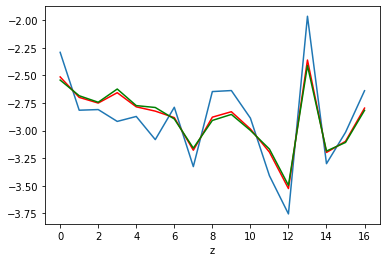

sigma_x_matlab: 0.195
sigma_x_new: 0.173

sigma_y_matlab: 2.242
sigma_y_new: 2.254

sigma_z_matlab: 0.489
sigma_z_new: 0.303
sigma_z_oil: 0.283
sigma_z_multfact: 0.223
z_mult: 2.0472365831627015

PARTICLE ID:  91
training images shape (25, 64, 64, 2)
validation images shape (25, 64, 64, 1)


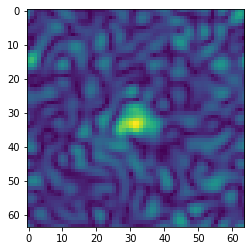

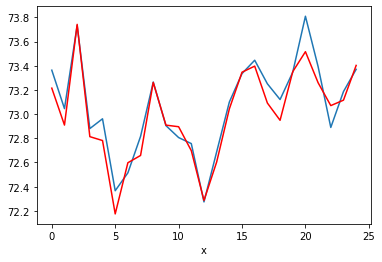

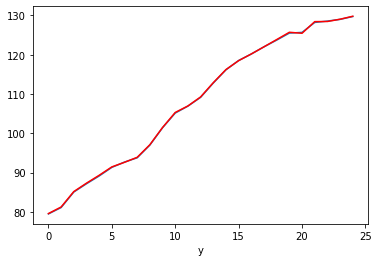

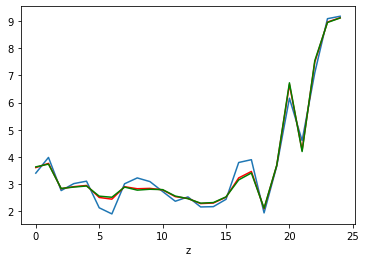

sigma_x_matlab: 0.190
sigma_x_new: 0.218

sigma_y_matlab: 2.247
sigma_y_new: 2.223

sigma_z_matlab: 0.313
sigma_z_new: 0.579
sigma_z_oil: 0.613
sigma_z_multfact: 0.739
z_mult: -1.1732941969621316

PARTICLE ID:  92
training images shape (24, 64, 64, 2)
validation images shape (24, 64, 64, 1)


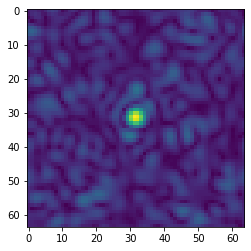

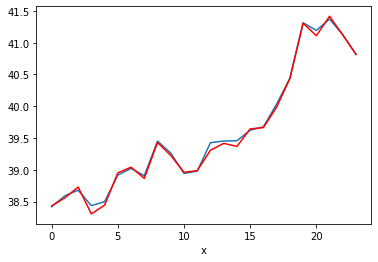

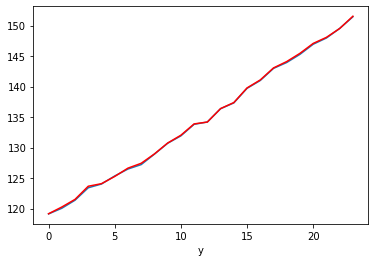

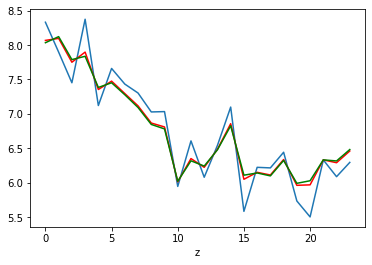

sigma_x_matlab: 0.132
sigma_x_new: 0.086

sigma_y_matlab: 1.353
sigma_y_new: 1.348

sigma_z_matlab: 0.497
sigma_z_new: 0.196
sigma_z_oil: 0.153
sigma_z_multfact: 0.087
z_mult: 2.10632720737816

PARTICLE ID:  93
training images shape (16, 64, 64, 2)
validation images shape (16, 64, 64, 1)


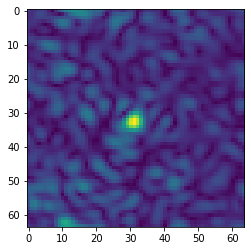

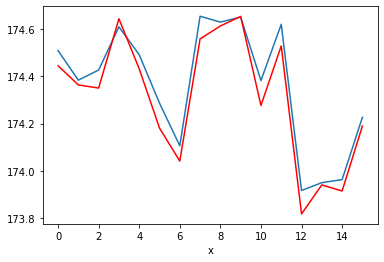

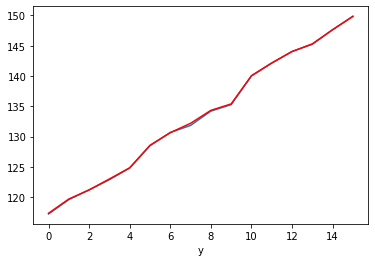

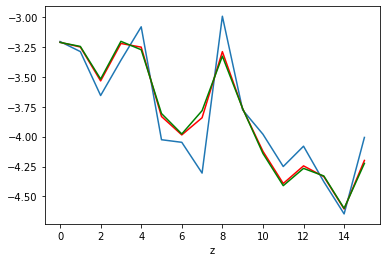

sigma_x_matlab: 0.153
sigma_x_new: 0.170

sigma_y_matlab: 2.112
sigma_y_new: 2.108

sigma_z_matlab: 0.335
sigma_z_new: 0.065
sigma_z_oil: 0.036
sigma_z_multfact: 0.075
z_mult: 1.0936085320805287

PARTICLE ID:  94
training images shape (18, 64, 64, 2)
validation images shape (18, 64, 64, 1)


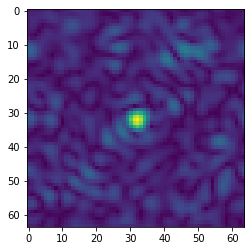

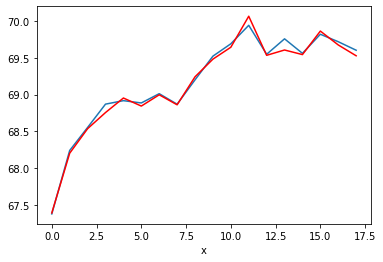

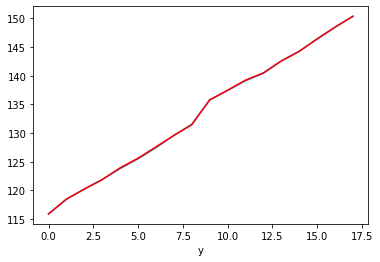

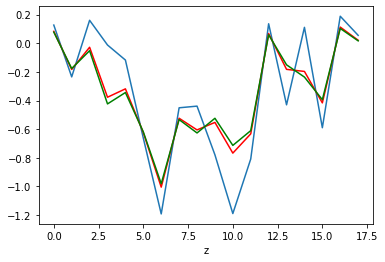

sigma_x_matlab: 0.119
sigma_x_new: 0.099

sigma_y_matlab: 2.004
sigma_y_new: 1.999

sigma_z_matlab: 0.332
sigma_z_new: 0.181
sigma_z_oil: 0.167
sigma_z_multfact: 0.138
z_mult: 1.6315468522476178

PARTICLE ID:  95
training images shape (20, 64, 64, 2)
validation images shape (20, 64, 64, 1)


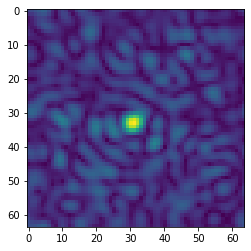

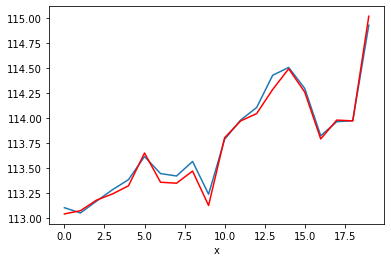

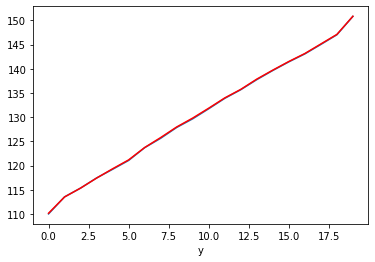

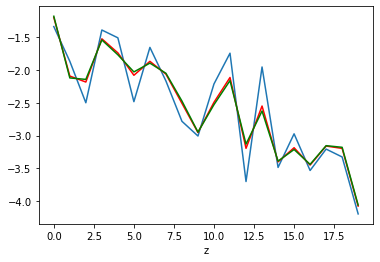

sigma_x_matlab: 0.011
sigma_x_new: 0.097

sigma_y_matlab: 2.058
sigma_y_new: 2.060

sigma_z_matlab: 0.713
sigma_z_new: 0.321
sigma_z_oil: 0.275
sigma_z_multfact: 0.144
z_mult: 1.7100422368356636

PARTICLE ID:  96
training images shape (26, 64, 64, 2)
validation images shape (26, 64, 64, 1)


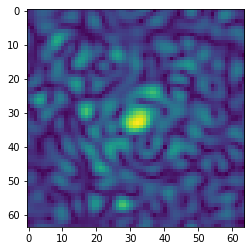

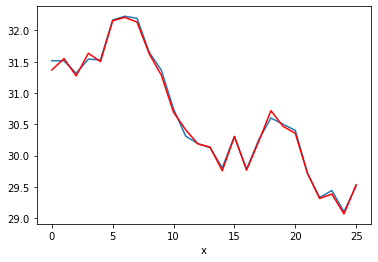

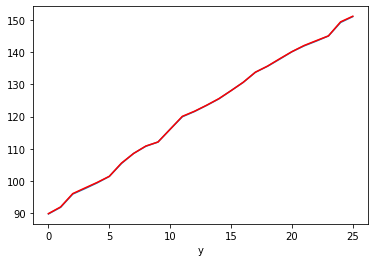

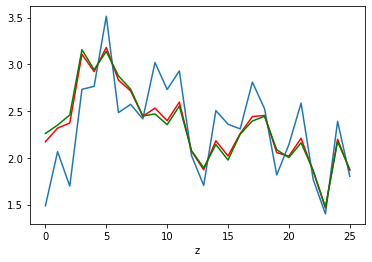

sigma_x_matlab: 0.104
sigma_x_new: 0.053

sigma_y_matlab: 2.450
sigma_y_new: 2.446

sigma_z_matlab: 0.357
sigma_z_new: 0.180
sigma_z_oil: 0.161
sigma_z_multfact: 0.111
z_mult: 1.7373722558747886

PARTICLE ID:  97
training images shape (16, 64, 64, 2)
validation images shape (16, 64, 64, 1)


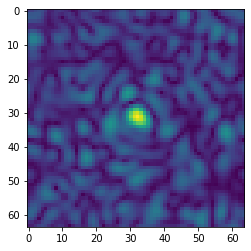

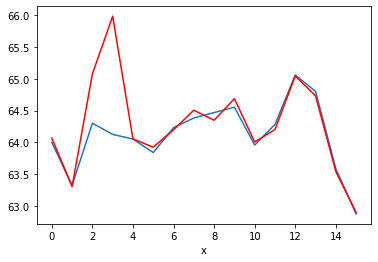

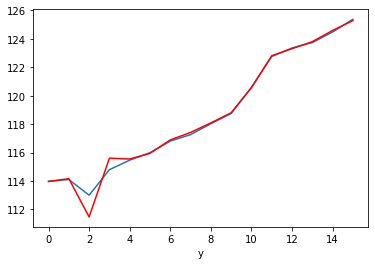

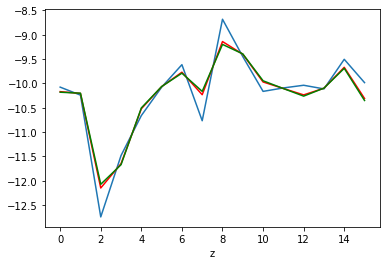

sigma_x_matlab: 0.111
sigma_x_new: 0.210

sigma_y_matlab: 0.799
sigma_y_new: 0.440

sigma_z_matlab: 0.617
sigma_z_new: 0.208
sigma_z_oil: 0.139
sigma_z_multfact: 0.175
z_mult: 2.264783556629188

PARTICLE ID:  98
training images shape (22, 64, 64, 2)
validation images shape (22, 64, 64, 1)


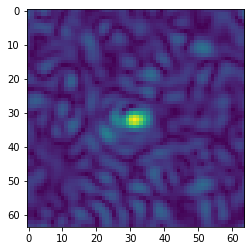

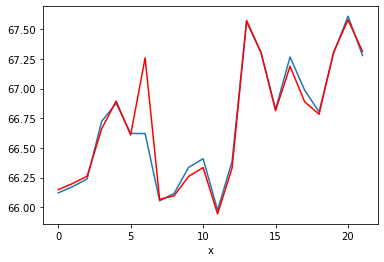

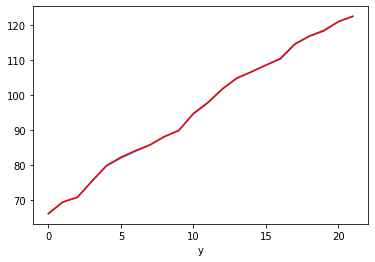

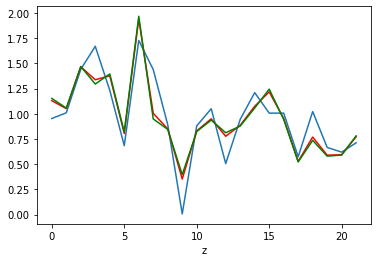

sigma_x_matlab: 0.091
sigma_x_new: 0.232

sigma_y_matlab: 2.706
sigma_y_new: 2.711

sigma_z_matlab: 0.245
sigma_z_new: 0.304
sigma_z_oil: 0.319
sigma_z_multfact: 0.383
z_mult: 0.05858839405804779

PARTICLE ID:  99
training images shape (23, 64, 64, 2)
validation images shape (23, 64, 64, 1)


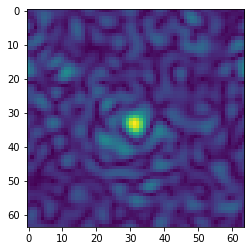

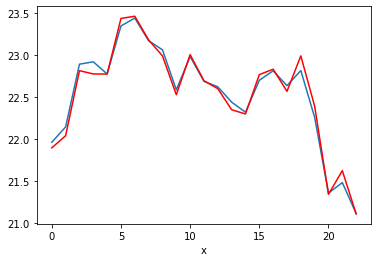

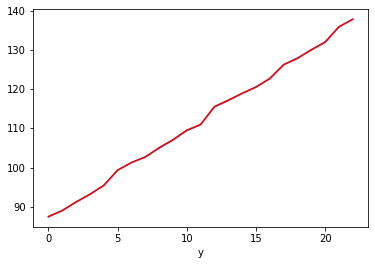

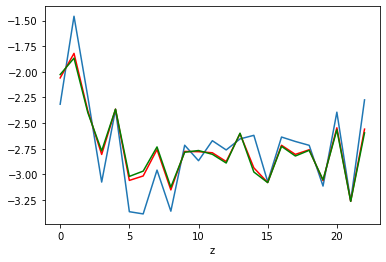

sigma_x_matlab: 0.075
sigma_x_new: 0.111

sigma_y_matlab: 2.273
sigma_y_new: 2.270

sigma_z_matlab: 0.429
sigma_z_new: 0.297
sigma_z_oil: 0.283
sigma_z_multfact: 0.240
z_mult: 2.223626398820293

optimal mult.factor: 1.6056629216553495
[array([-4.24385823, -3.68603919, -4.43304572, -4.58281066, -4.90393891,
       -5.19864382, -5.15395059, -5.13599234, -5.15180612, -5.06937959,
       -5.16998214, -5.25618428, -5.16883113, -5.06600822, -5.34164088,
       -4.60038766]), array([5.34294586, 5.14156777, 5.39348708, 5.63850883, 5.19197248,
       5.05648125, 5.00706613, 5.30918702, 5.71615657, 5.51307281,
       5.5615649 , 5.34723781, 5.18001799, 5.33615701, 4.78513223,
       4.78437669, 4.81590125])]


In [105]:
from scipy.optimize import minimize

original_model = models[-1]
def compare_lode_matlab(val_stack):
    out_sigmas_new = []
    out_sigmas_matlab = []
    z_mults = []
    traces = []
    for particle_id in range(len(val_stack)):
        print("PARTICLE ID: ", particle_id)

        training_images = np.stack((np.real(particles_timeseries[particle_id])[:,:,:,0], np.imag(particles_timeseries[particle_id][:,:,:,0])), axis=-1)
        print(f"training images shape {training_images.shape}")
        validation_set = particles_timeseries[particle_id][:,:,:,:]
        print(f"validation images shape {validation_set.shape}")

        training_set = create_training_set(training_images)

        generator = dt.models.lodestar.LodeSTARGenerator(
            training_set,
            num_outputs=num_outputs, 
            transformation_function=(group, equivariance), 
            batch_size=8, 
            min_data_size=100, 
            max_data_size=101,
        )

        model = original_model
        #with generator:
        #    h = model.fit(generator, epochs=15, steps_per_epoch=50, verbose=0)


        timeseries = np.stack( (np.real(val_stack[particle_id][:,:,:,0]), np.imag(val_stack[particle_id][:,:,:,0])), axis=-1)
        corrections = predict_on_stack(model, timeseries)
        x_lode, y_lode, z_lode = corrections[:,0], corrections[:,1], corrections[:,2]
        x_matlab, y_matlab, z_matlab = particles_positions[particle_id][:,0], particles_positions[particle_id][:,1], particles_positions[particle_id][:,2]

        z_lode = z_lode/-10
        z_lode = z_lode - np.mean(z_lode)
        x_new, y_new, z_new = x_matlab+(32+x_lode)*0.114, y_matlab+(32+y_lode)*0.114, z_lode+z_matlab
        z_oil_maybe = z_matlab+z_lode*1.5/1.33
        z_shoudlnt = z_matlab+z_lode*1.6



        plt.imshow(np.abs(timeseries[0,:,:,0]+1j*timeseries[0,:,:,1]))
        plt.show()

        plt.plot(list(range(len(x_matlab))), x_matlab)
        plt.xlabel("x")
        plt.plot(list(range(len(x_lode))), x_new, 'r')
        plt.show()

        plt.plot(list(range(len(y_matlab))), y_matlab)
        plt.plot(list(range(len(y_lode))), y_new, 'r')
        plt.xlabel("y")
        plt.show()

        plt.plot(list(range(len(z_matlab))), z_matlab)
        plt.plot(list(range(len(z_lode))), z_new, 'r')
        plt.plot(list(range(len(z_oil_maybe))), z_oil_maybe, 'g')
        plt.xlabel("z")
        plt.show()

        print(f"sigma_x_matlab: {calc_sigma(x_matlab):.3f}")
        print(f"sigma_x_new: {calc_sigma(x_new):.3f}\n")

        print(f"sigma_y_matlab: {calc_sigma(y_matlab):.3f}")
        print(f"sigma_y_new: {calc_sigma(y_new):.3f}\n")

        print(f"sigma_z_matlab: {calc_sigma(z_matlab):.3f}")
        print(f"sigma_z_new: {calc_sigma(z_new):.3f}")
        print(f"sigma_z_oil: {calc_sigma(z_oil_maybe):.3f}")
        print(f"sigma_z_multfact: {calc_sigma(z_shoudlnt):.3f}")

        def sigma_z(x):
            arr = z_matlab + z_lode*x
            return calc_sigma(arr)

        z_mult = minimize(sigma_z, [1], method="Powell").x
        print(f"z_mult: {z_mult}\n")

        out_sigmas_new.append([calc_sigma(x_new), calc_sigma(y_new), calc_sigma(z_new)])
        out_sigmas_matlab.append([calc_sigma(x_matlab), calc_sigma(y_matlab), calc_sigma(z_matlab)])
        z_mults.append(z_mult)
        traces.append(np.array([x_matlab, y_matlab, z_new]))

    return np.array(out_sigmas_new), np.array(out_sigmas_matlab), z_mults, traces

new_sigmas, matlab_sigmas, z_mults, traces = compare_lode_matlab(particles_timeseries)
print(f"optimal mult.factor: {np.mean(z_mults)}")
print(z_traces)

In [107]:

def id_new_better_than_matlab(new_sigmas, matlab_sigmas):
    out = []
    for i in range(new_sigmas.shape[0]):
        #print(i, f"   {np.linalg.norm(new_sigmas[i,:])/np.linalg.norm(matlab_sigmas[i,:]):.2f}", f"   {np.linalg.norm(new_sigmas[i,2])/np.linalg.norm(matlab_sigmas[i,2]):.2f}")
        if np.linalg.norm(new_sigmas[i,2]) < np.linalg.norm(matlab_sigmas[i,2]):
            out.append(i)
    return out


#OPTIMAL MULT.FAKTOR: 1.600333833

bin = np.linspace(0,0.5,10)
ids = id_new_better_than_matlab(new_sigmas, matlab_sigmas)
print(len(ids), len(particles_timeseries))
print(f"korrigerad sigma_z: {np.mean(new_sigmas[ids,2])}, matlabs sigma_z: {np.mean(matlab_sigmas[ids,2])}")
print(np.mean(new_sigmas[ids,0]), np.mean(matlab_sigmas[ids,0]))

_traces = traces
print(len(traces))

92 100
korrigerad sigma_z: 0.2253206264694315, matlabs sigma_z: 0.41973081308070787
0.1500121356035503 0.12484139240756713
100


In [108]:
def get_msd(x, max_dt=4):

    output = []
    for delt in range(max_dt):
        delta_x = x[1 + delt :] - x[: -(1 + delt)]
        
        th = 100 * np.sqrt(delt + 1)
        if np.any(delta_x > th):
            print(np.sum(delta_x > th))

        delta_x[delta_x > th] = 0
        squared_displacement = np.square(delta_x).sum(axis=-1)
        # superful fix här, för att den ska fungera för ensamma traces :----)
        if type(squared_displacement) == np.float32 or type(squared_displacement) == np.float64:
          length = 1
        else:
          length = len(squared_displacement)
        output.append(
            (
                np.mean(squared_displacement),
                np.std(squared_displacement),
                length,
            )
        )

    return np.array(output)

def fit_to_line(msd):
    return np.polyfit(range(1, msd.shape[0]+1), msd[:, 0], 1)

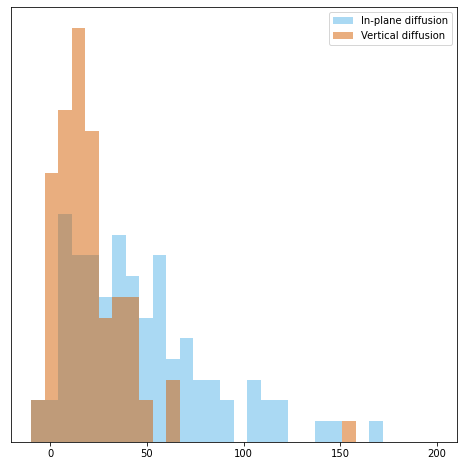

In [120]:
' DIFFUSION CALCULATIONS'
"""
  TODO:
    - make all_positions include all traces
"""
import seaborn
delta_time = 1/42
msds = []
msds_z = []

for pos in traces:
    msd = get_msd(pos[0,:], 10) 
    a, b = fit_to_line(msd[:4])
    msds.append(a)

    msd_z = get_msd(pos[2,:], 10)
    a, b = fit_to_line(msd_z[:4])
    msds_z.append(a)


plt.figure(figsize=(8, 8))
plt.hist(np.array(msds) / delta_time / 2, 30, alpha=0.5, range=(-10,200), facecolor=seaborn.color_palette("colorblind")[9], label="In-plane diffusion")
plt.hist(np.array(msds_z) / delta_time / 2, 30, alpha=0.5, range=(-10,200), facecolor=seaborn.color_palette("colorblind")[3], label="Vertical diffusion")
plt.yticks([])
plt.legend()